## Preproccessing and Setup

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
sns.set(style="white")
import warnings
warnings.filterwarnings('ignore')
import pickle
# import dcor 
# from statsmodels.tsa.seasonal import seasonal_decompose

import tensorflow as tf
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization

# from sklearn.preprocessing import MinMaxScaler, StandardScaler
# from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [2]:
tf.random.set_seed(13)
def mean_absolute_percentage_error(y_true, y_pred): 
  for i in range(len(y_true)):
    if y_true[i] == 0:
      print('MAPE * Founded')
      y_true[i] = np.mean(y_true)
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
data = pd.read_csv('DowDataset.csv', sep=',', date_parser=True)
dataset1 = data.iloc[:343].copy()
dataset2 = data.iloc[396:754].copy()
dataset_test = data.iloc[761:].copy()
full_dataset = pd.concat([dataset1, dataset2], axis=0 , ignore_index=True)
full_dataset = full_dataset.drop(['DATE', 'Flow_to_EQ'], axis=1)

In [4]:
class approach1:
  def __init__(self, df, goal):
    self.df = df.copy()
    self.goal = goal

    self.df['trend'] = self.df[self.goal].rolling(7).mean().fillna(method='bfill')
    self.df['residual'] = self.df[self.goal] - self.df['trend']
    self.df['target'] = self.df['residual'].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_layers = 2
      self.model_neurons = [26, 30]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_layers = 1
      self.model_neurons = 32
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_layers = 1
      self.model_neurons = 26

    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std

    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 6, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach1.h5')

  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100    
    for optimizer in OPTIMIZER:
      for num_layer in NUM_LAYER:
        if num_layer == 1:
          for neurons in NUM_UNITS:
            self.model = tf.keras.Sequential()
            self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
            self.model.add(Dense(1))
            self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
            history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
            # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history_Ann.history['val_loss']))
            self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
            print(self.tune_results[f'{n}'])
            if min(history_Ann.history['val_loss']) < min_score:
              min_score = min(history_Ann.history['val_loss'])
              min_score_pos = n
            n+=1
        if num_layer == 2:
          for neurons in NUM_UNITS:
            for neurons2 in NUM_UNITS:
              self.model = tf.keras.Sequential()
              self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
              self.model.add(Dense(neurons2, activation='relu'))
              self.model.add(Dense(1))
              self.model.compile(optimizer= optimizer, loss='mse', metrics=['MAPE'])    
              history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)   
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history_Ann.history['val_loss'])) 
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history_Ann.history['val_loss']), 'Epoch':history_Ann.history['val_loss'].index(min(history_Ann.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history_Ann.history['val_loss']) < min_score:
                min_score = min(history_Ann.history['val_loss'])
                min_score_pos = n
              n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}']
  
  def testing(self, df_test):
    self.df_test = df_test.copy()
    self.df_test['trend'] = self.df_test[self.goal].rolling(7).mean().fillna(method='ffill')
    self.df_test = self.df_test.iloc[-self.df_test.shape[0]+7:]
    self.df_test['residual'] = self.df_test[self.goal] - self.df_test['trend']
    self.df_test['target'] = self.df_test['residual'].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.Xt = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON', 'residual']].fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD', 'residual']].fillna(method='ffill')

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill')
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.prediction = self.prediction*self.y_std + self.y_mean
    self.full_prediction = self.df_test['trend'].reset_index(drop=True) + self.prediction['Prediction']

    print('*** ANN estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()


In [5]:
class approach2:
  def __init__(self, df, goal):
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
      self.model_optimizer = 'SGD'
      self.model_layers = 2
      self.model_neurons = [32, 4]
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_layers = 2
      self.model_neurons = [2, 18]
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
      self.model_optimizer = 'adam'
      self.model_layers = 2
      self.model_neurons = [18, 26]

    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def series_to_supervised(self, n_in=5, n_out=1, dropnan=True):
    self.n_in = n_in
    self.n_out = n_out

    n_vars = 1 if type(self.X_train) is list else self.X_train.shape[1]
    df = pd.DataFrame(self.X_train)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
      cols.append(df.shift(i))
      names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
      cols.append(df.shift(-i))
      if i == 0:
        names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
      else:
        names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
      agg.dropna(inplace=True)
    self.supervised = agg
    self.supervised_train = self.supervised.values.reshape((self.supervised.shape[0], 1, self.supervised.shape[1]))
    self.Y_train = self.Y_train.iloc[n_in:]

  def training(self, neurons = [10, 14], max_epochs = 50):
    #print(neurons)
    self.model = tf.keras.Sequential()
    self.model.add(LSTM(self.model_neurons[0], activation='linear', return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
    self.model.add(Dropout(0.1))
    if self.model_layers == 2:
      self.model.add(BatchNormalization())
      self.model.add(LSTM(self.model_neurons[1], activation='linear'))
    self.model.add(Dense(1))
    self.model.compile(loss='mse', optimizer=self.model_optimizer, metrics=['mape'])  
    history = self.model.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('approach2.h5')
  
  def tune(self, max_epochs = 50):
    self.tune_results = {}
    OPTIMIZER = ['SGD', 'adam']
    NUM_UNITS = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32]
    NUM_LAYER = [1, 2]
    n = 1
    min_score = 100    
    for optimizer in OPTIMIZER:
      for num_layer in NUM_LAYER:
        if num_layer == 1:
          for neurons in NUM_UNITS:
            self.models = tf.keras.Sequential()
            self.models.add(LSTM(neurons, activation='relu', return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
            self.models.add(Dropout(0.1))
            self.models.add(Dense(1))
            self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
            history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1)
            # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - Score: ', min(history.history['val_loss']))
            self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Layers':num_layer , 'Neurons': {neurons}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
            print(self.tune_results[f'{n}'])
            if min(history.history['val_loss']) < min_score:
              min_score = min(history.history['val_loss'])
              min_score_pos = n
            n+=1
        if num_layer == 2:
          for neurons in NUM_UNITS:
            for neurons2 in NUM_UNITS:
              self.models = tf.keras.Sequential()
              self.models.add(LSTM(neurons, activation='relu', return_sequences=True, input_shape=(self.supervised_train.shape[1:])))
              self.models.add(Dropout(0.1))
              self.models.add(BatchNormalization())
              self.models.add(LSTM(neurons2, activation='relu', return_sequences=True))
              self.models.add(Dense(1))
              self.models.compile(loss='mse', optimizer=optimizer, metrics=['mape'])  
              history = self.models.fit(self.supervised_train, self.Y_train, epochs=max_epochs, verbose=0, validation_split=0.1) 
              # print('Optimizer: ', optimizer, ' - Layers: ', num_layer , ' - neurons: ', neurons, ' - ', neurons2, ' - Score: ', min(history.history['val_loss'])) 
              self.tune_results[f'{n}']  = {'Optimizer': optimizer, 'Layers':num_layer , 'Neurons': {neurons, neurons2}, 'Score' : min(history.history['val_loss']), 'Epoch':history.history['val_loss'].index(min(history.history['val_loss']))}
              print(self.tune_results[f'{n}'])
              if min(history.history['val_loss']) < min_score:
                min_score = min(history.history['val_loss'])
                min_score_pos = n
              n+=1  
    self.best_tuned = self.tune_results[f'{min_score_pos}'] 

  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    def series_to_supervised_test(X_test, n_in=self.n_in, n_out=self.n_out, dropnan=True):
      n_vars = 1 if type(X_test) is list else X_test.shape[1]
      df = pd.DataFrame(X_test)
      cols, names = list(), list()
      # input sequence (t-n, ... t-1)
      for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('%s(t-%d)' % (df.columns[j],i)) for j in range(n_vars)]
      # forecast sequence (t, t+1, ... t+n)
      for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
          names += [('%s(t)' % (df.columns[j])) for j in range(n_vars)]
        else:
          names += [('%s(t+%d)' % (df.columns[j], i)) for j in range(n_vars)]
      # put it all together
      agg = pd.concat(cols, axis=1)
      agg.columns = names
      # drop rows with NaN values
      if dropnan:
        agg.dropna(inplace=True)
      supervised = agg
      supervised_test = supervised.values.reshape((supervised.shape[0], 1, supervised.shape[1]))
      return supervised_test
    # self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.Xt = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.Xt = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='ffill')

    # self.Xt = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill')
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill').iloc[self.n_in:]
    self.supervised_test = series_to_supervised_test(self.X_test)
    
    self.prediction = pd.DataFrame(self.model.predict(self.supervised_test).reshape(-1,1), columns=['Prediction'])
    self.full_prediction = self.prediction*self.y_std + self.y_mean
    
    print('*** LSTM estimation ***')
    # print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    # print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction.values))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction.values, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [6]:
class approach3:
  def __init__(self, df, goal):    
    self.df = df.copy()
    self.goal = goal

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    if self.goal == 'D_COD_ON':
      self.X = self.df[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill')
    elif self.goal == 'EQ_COD':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    elif self.goal == 'BT_C_MVLSS':
      self.X = self.df[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill')
    
    # self.X = self.df[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='bfill')
    self.Y = self.df['target'].fillna(method='bfill')
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = self.X
    self.Y_train = self.Y
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
    # self.model.save('approach3.h5')
  
  def testing(self, df_test):
    self.df_test = df_test.copy()
    
    if self.goal == 'D_COD_ON':
      self.X_test = self.df_test[['D_SS', 'BT_C_N', 'EQ_N', 'BT_C_DO', 'ST_COD', 'EQ_COD', 'D_COD_ON']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'EQ_COD':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_N_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')
    elif self.goal == 'BT_C_MVLSS':
      self.X_test = self.df_test[['BT_C_MVLSS', 'D_SS', 'EQ_N', 'BT_C_N', 'OxT_PH_PM', 'BT_C_DO', 'Clari_DO', 'ST_COD', 'EQ_COD']].fillna(method='bfill').fillna(method='ffill')

    # self.X_test = self.df_test[['BT_C_MLSS','EQ_N', 'BT_C_N', 'D_COD_ON']].fillna(method='ffill').fillna(method='bfill')
    self.X_test = (self.X_test - self.x_mean)/self.x_std
    self.Y_test = self.df_test[self.goal].shift(-1).fillna(method='ffill')
        
    self.prediction = self.model.predict(self.X_test)
    # self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])
    self.amplifier = 10
    full_prediction = self.prediction*self.y_std + self.y_mean

    self.full_prediction = full_prediction
    # self.full_prediction = np.zeros(len(self.prediction))
    # self.full_prediction[0] = self.df_test[self.goal].reset_index(drop=True)[0] + full_prediction[0] 
    # for i in range(1,len(self.prediction)):
    #   self.full_prediction[i] = self.full_prediction[i-1] - full_prediction[i]
    # self.full_prediction = 3*self.prediction
    
    print('*** Delta estimation ***')
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))
    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel(f'{self.goal} (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

# BT_C_MVLSS

In [7]:
active_target = "BT_C_MVLSS"
dataset = full_dataset.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701 entries, 0 to 700
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Flow_efl    701 non-null    float64
 1   BT_C_MLSS   701 non-null    float64
 2   BT_C_MVLSS  701 non-null    float64
 3   BT_N_MLSS   701 non-null    float64
 4   BT_N_MVLSS  701 non-null    float64
 5   D_SS        701 non-null    float64
 6   EQ_N        701 non-null    float64
 7   BT_C_N      701 non-null    float64
 8   BT_N_N      701 non-null    float64
 9   D_N         701 non-null    float64
 10  OxT_PH_PM   701 non-null    float64
 11  EQ_PH       701 non-null    float64
 12  BT_N_PH     701 non-null    float64
 13  D_PH        701 non-null    float64
 14  BT_N_DO     701 non-null    float64
 15  BT_C_DO     701 non-null    float64
 16  Clari_DO    701 non-null    float64
 17  F/M         701 non-null    float64
 18  ST_COD      688 non-null    float64
 19  EQ_COD      701 non-null    f

## Approach 1

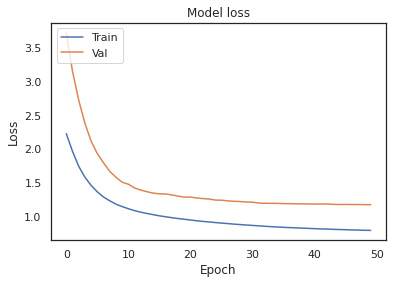

*** ANN estimation ***
MAPE * Founded
MAPE:  17.02512726535003
R2:  0.4617639768924999
RMSE:  20.345882615611412


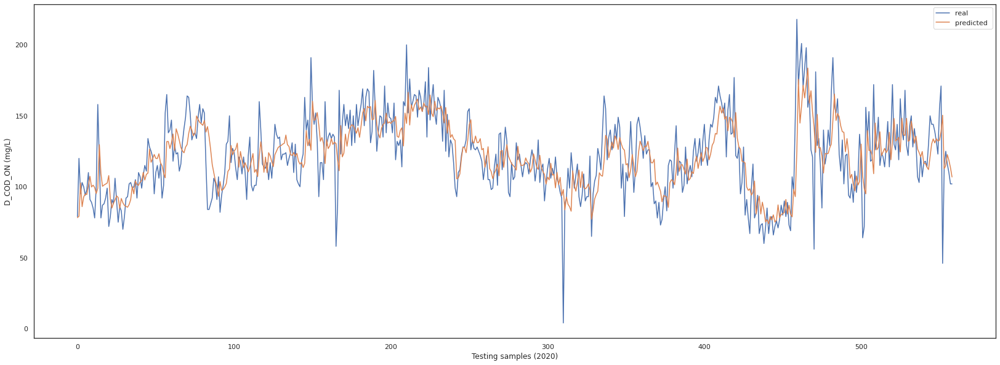

(559,)

In [89]:
cut_off = 135
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape


 ## Approach 2

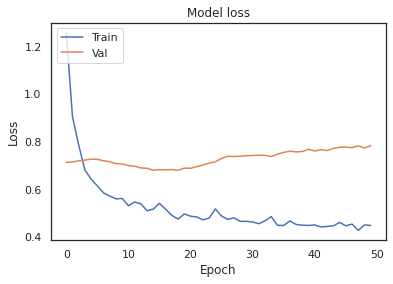

*** LSTM estimation ***
MAPE * Founded
MAPE:  29.13043009934863
R2:  0.5701453315751018
RMSE:  18.18239038105372


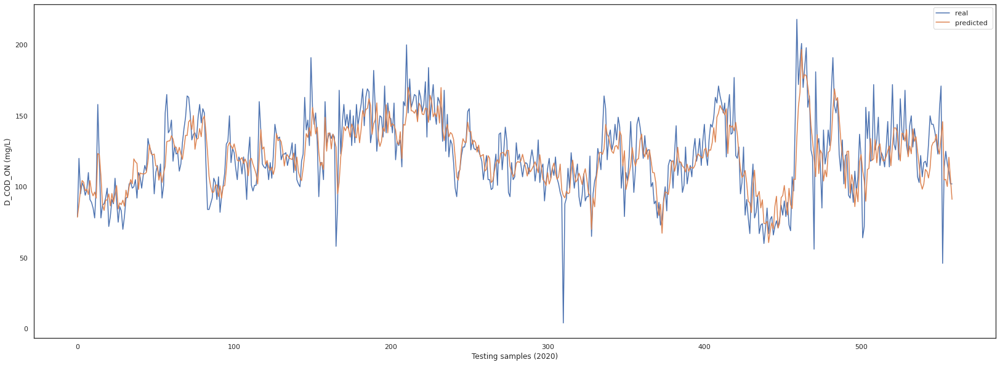

(559, 1)

In [90]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=2)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[5:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE * Founded
MAPE:  17.446169623289794
R2:  0.4531540599592928
RMSE:  20.507968898805927


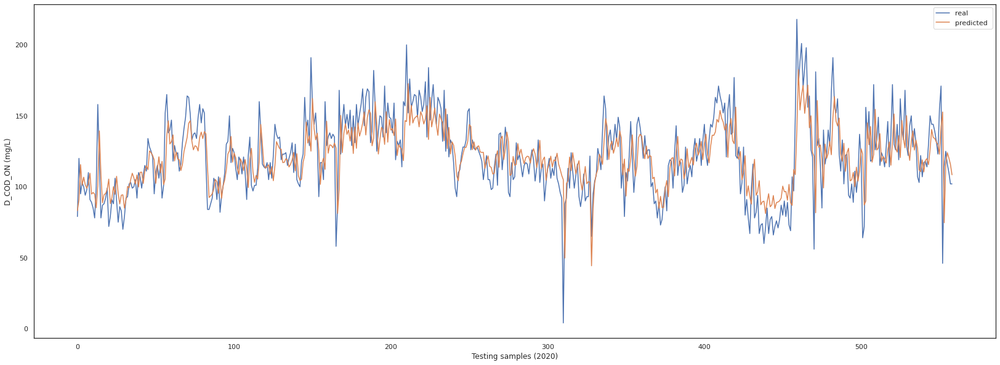

(559,)

In [91]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

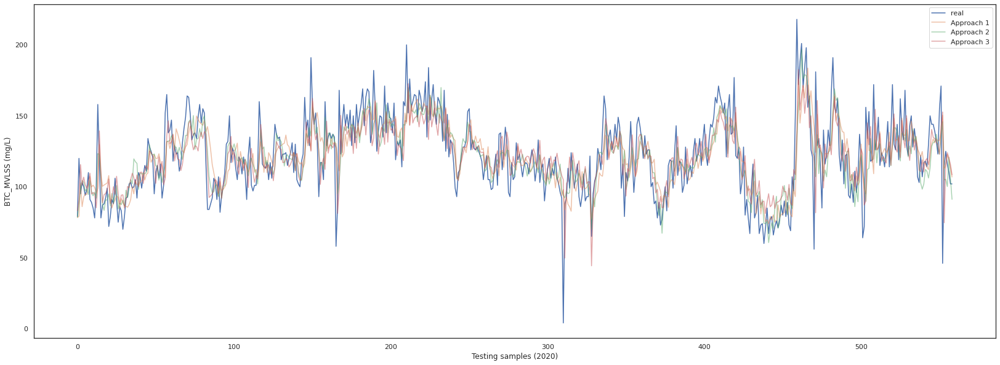

In [92]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [93]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      239.904705
1      257.739052
2      316.456419
3      291.471571
4      302.728946
          ...    
554    335.990864
555    346.838296
556    359.733577
557    335.468123
558    306.412030
Length: 559, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  16.76984418016378
R2:  0.4896766381840886
RMSE:  19.811295650305404


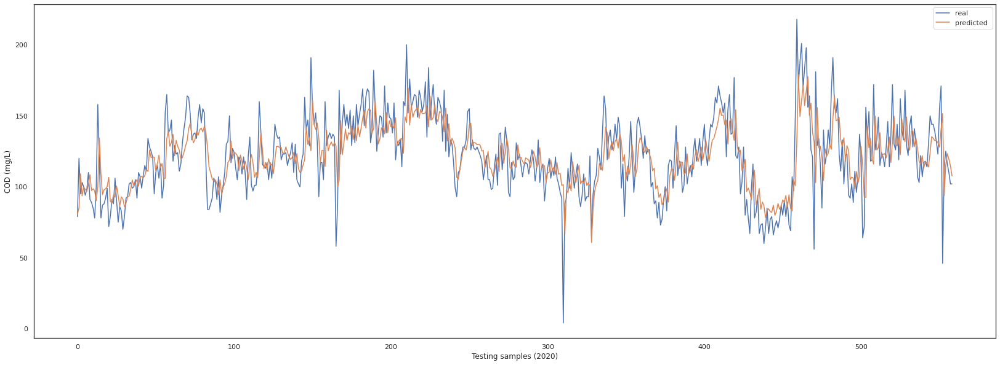

In [94]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  15.917872532806188
R2:  0.5344734556945636
RMSE:  18.921796996526346


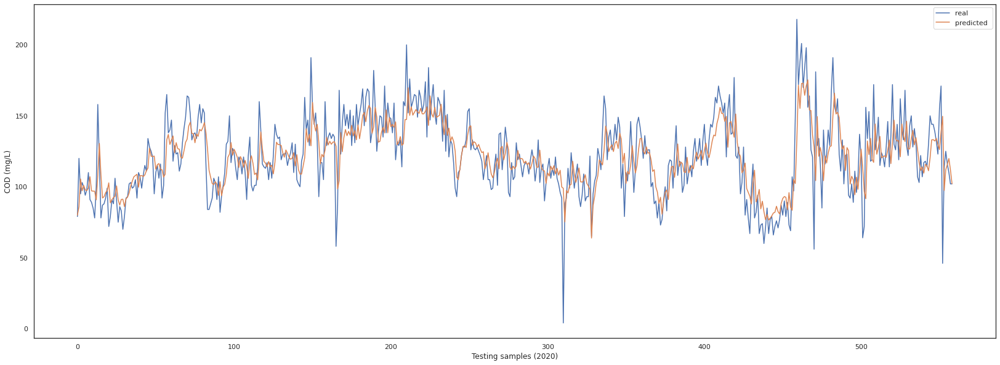

In [95]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

In [96]:
class Ensemble:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[['model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[['model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 1s 11ms/step - loss: 1.3133 - MAPE: 147.1324 - val_loss: 0.7115 - val_MAPE: 134.7012
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 1.1050 - MAPE: 126.0484 - val_loss: 0.6782 - val_MAPE: 123.0958
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 0.9325 - MAPE: 123.4814 - val_loss: 0.6604 - val_MAPE: 121.2089
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 0.7889 - MAPE: 120.8625 - val_loss: 0.6501 - val_MAPE: 124.8288
Epoch 5/50
16/16 [==============================] - 0s 3ms/step - loss: 0.6796 - MAPE: 133.7747 - val_loss: 0.6562 - val_MAPE: 134.9825
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5920 - MAPE: 142.9050 - val_loss: 0.6702 - val_MAPE: 149.9688
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5313 - MAPE: 155.6391 - val_loss: 0.6901 - val_MAPE: 166.4810
Epoch 8/50
16/16 [=============================

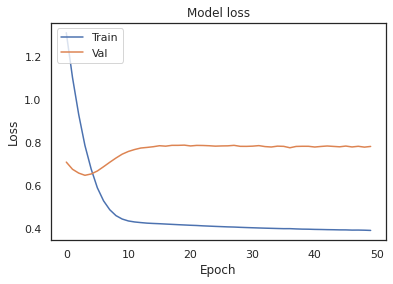

In [97]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[1.39795344e+08 1.54843760e+08 1.73629568e+08 1.78247104e+08
 1.80957120e+08 1.71289408e+08 1.73970176e+08 1.66744208e+08
 1.83734192e+08 1.72235808e+08 1.66500928e+08 1.71539376e+08
 1.65472416e+08 2.07655856e+08 2.13627744e+08 1.90145760e+08
 1.56545216e+08 1.49460624e+08 1.60958688e+08 1.60959616e+08
 1.70648544e+08 1.54423056e+08 1.69046672e+08 1.55932800e+08
 1.67480192e+08 1.76506176e+08 1.48915856e+08 1.57774768e+08
 1.54735200e+08 1.60239872e+08 1.54274432e+08 1.73713168e+08
 1.61658672e+08 1.75688944e+08 1.82025488e+08 1.78930624e+08
 2.00229760e+08 2.05367456e+08 2.02852016e+08 1.73952640e+08
 1.93035088e+08 1.92090432e+08 1.93664608e+08 1.91971296e+08
 1.93247664e+08 2.08575616e+08 2.37812496e+08 2.23990432e+08
 2.21177920e+08 2.21922880e+08 2.01927488e+08 2.02825056e+08
 1.96144976e+08 1.94904416e+08 1.89546960e+08 1.93565216e+08
 2.02552768e+08 2.39264944e+08 2.33444720e+08 2.40748320e+08
 2.47449920e+08 2.43201280e+08 2.

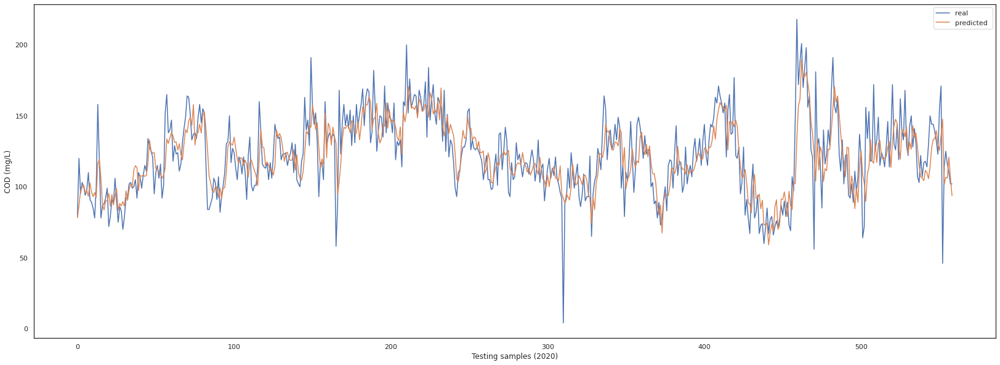

In [98]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


In [99]:
class Ensemble2:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[[self.goal, 'model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 0s 11ms/step - loss: 0.7603 - MAPE: 214.4927 - val_loss: 0.8084 - val_MAPE: 225.0222
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 0.7047 - MAPE: 197.6039 - val_loss: 0.7795 - val_MAPE: 211.2923
Epoch 3/50
16/16 [==============================] - 0s 4ms/step - loss: 0.6660 - MAPE: 191.5807 - val_loss: 0.7706 - val_MAPE: 204.9866
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 0.6237 - MAPE: 187.0766 - val_loss: 0.7744 - val_MAPE: 206.1295
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5944 - MAPE: 188.1326 - val_loss: 0.7781 - val_MAPE: 207.9088
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5663 - MAPE: 189.6230 - val_loss: 0.7833 - val_MAPE: 210.1914
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5447 - MAPE: 189.8147 - val_loss: 0.7818 - val_MAPE: 209.3099
Epoch 8/50
16/16 [=============================

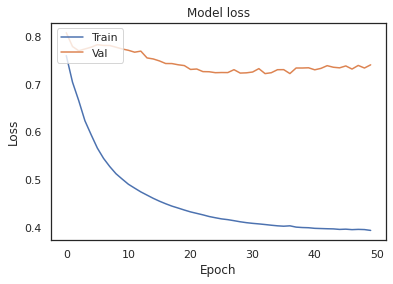

In [100]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[1.28338072e+08 1.48238432e+08 1.92700544e+08 1.81246432e+08
 1.81094512e+08 1.65460016e+08 1.63942880e+08 1.66089840e+08
 1.81339056e+08 1.58555344e+08 1.58180336e+08 1.63372640e+08
 1.48055216e+08 2.15389376e+08 2.34343344e+08 1.90486416e+08
 1.49136128e+08 1.57681616e+08 1.58289744e+08 1.62302960e+08
 1.74404048e+08 1.48937248e+08 1.59667328e+08 1.59767552e+08
 1.55593664e+08 1.77872816e+08 1.54830336e+08 1.47326768e+08
 1.49765456e+08 1.53372288e+08 1.44430688e+08 1.61646672e+08
 1.62899536e+08 1.70105520e+08 1.84014832e+08 1.81422624e+08
 2.11148096e+08 2.03906752e+08 2.03501280e+08 1.67562320e+08
 1.91270464e+08 1.89444224e+08 1.86294784e+08 1.89780368e+08
 1.93814128e+08 2.05892816e+08 2.34180176e+08 2.23856752e+08
 2.19326944e+08 2.18737152e+08 2.01405360e+08 1.99815744e+08
 2.02851840e+08 1.91227392e+08 1.96894832e+08 1.89438144e+08
 1.99082144e+08 2.37329904e+08 2.45630496e+08 2.40218848e+08
 2.46466704e+08 2.36899392e+08 2.

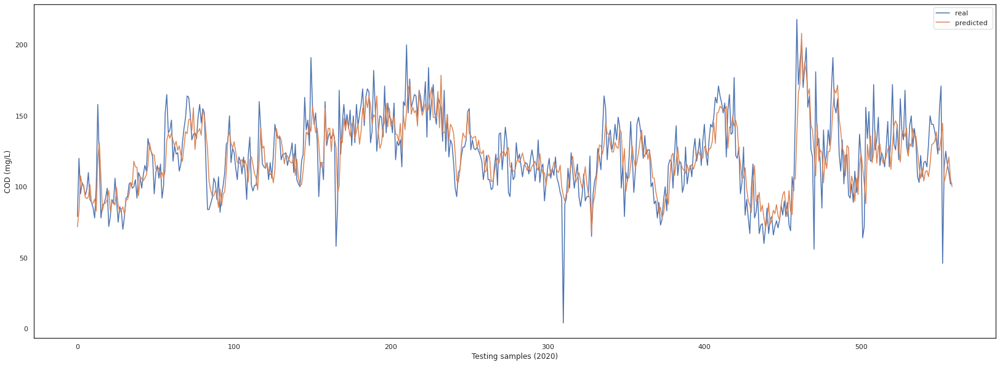

In [101]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

In [102]:
class Ensemble3:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
  

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
 
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 16, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons/2, activation='relu', input_dim = self.X_train.shape[1]))
    self.model.add(Dense(neurons, activation='relu'))
    self.model.add(Dense(3, activation='softmax'))

    print(self.Y_train.shape)
    print(self.X_train.shape)

    self.model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df_test['model1'] - self.df_test['target'])
    model2 = abs(self.df_test['model2'] - self.df_test['target'])
    model3 = abs(self.df_test['model3'] - self.df_test['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Yt = pd.get_dummies(temp)   

    self.Y_test = self.Yt
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    print(self.X_test, self.Y_train)

    self.score = self.model.evaluate(self.X_test, self.Y_test)
    self.prediction = self.model.predict(self.X_test)
    
    self.full_prediction = np.zeros(len(self.prediction))
    self.selection = pd.DataFrame(self.prediction).idxmax(axis=1)

    
    for i in range(len(self.prediction)):
      self.full_prediction[i] = self.df_test[f'model{int(self.selection[i])+1}'][i]
    # print(self.full_prediction)

    self.Ys_test = self.df_test['target']
    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('MAPEsci: ',mean_absolute_error(self.Ys_test, self.full_prediction)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('R2: ',r2_score(self.Ys_test, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Ys_test, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Ys_test, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

     0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
554  0  0  1
555  1  0  0
556  1  0  0
557  0  1  0
558  1  0  0

[559 rows x 3 columns]
(559, 3)
(559, 4)
Epoch 1/50
16/16 [==============================] - 1s 11ms/step - loss: 1.0862 - accuracy: 0.4036 - val_loss: 1.0773 - val_accuracy: 0.3214
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 1.0820 - accuracy: 0.4215 - val_loss: 1.0806 - val_accuracy: 0.3393
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 1.0803 - accuracy: 0.4175 - val_loss: 1.0847 - val_accuracy: 0.3214
Epoch 4/50
16/16 [==============================] - 0s 4ms/step - loss: 1.0786 - accuracy: 0.4175 - val_loss: 1.0887 - val_accuracy: 0.3214
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 1.0771 - accuracy: 0.4274 - val_loss: 1.0913 - val_accuracy: 0.3214
Epoch 6/50
16/16 [==============================] - 0s 3ms/step - loss: 1.0764 - accuracy: 0.4294 - v

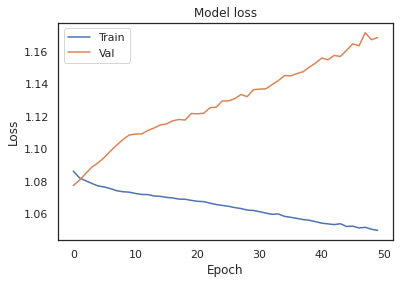

In [103]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

     D_COD_ON    model1    model2    model3
0   -1.822587 -2.106497 -2.040009 -2.030678
1   -1.504612 -2.058092 -1.598075 -1.615881
2   -0.056061 -0.921676 -1.086066 -0.289853
3   -0.939324 -1.731151 -0.784627 -1.066957
4   -0.656680 -1.399322 -0.843228 -0.765694
..        ...       ...       ...       ...
554 -0.268044 -0.330932 -0.745451 -0.272019
555  0.120591  0.045735 -0.989585  0.162529
556 -0.197383 -0.146030  0.011724 -0.039508
557 -0.409366 -0.394721 -0.697342 -0.282603
558 -0.692010 -0.716944 -1.428912 -0.676391

[559 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
554  0  0  1
555  1  0  0
556  1  0  0
557  0  1  0
558  1  0  0

[559 rows x 3 columns]
18/18 [==============================] - 0s 1ms/step - loss: 1.0602 - accuracy: 0.4436
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(167534667.6793559, shape=(), dtype=float64)
MAPEsci:  1329.709255431859
MAPE * Founded
MAPE:  15.256229608655927
R2:  0.5445255522

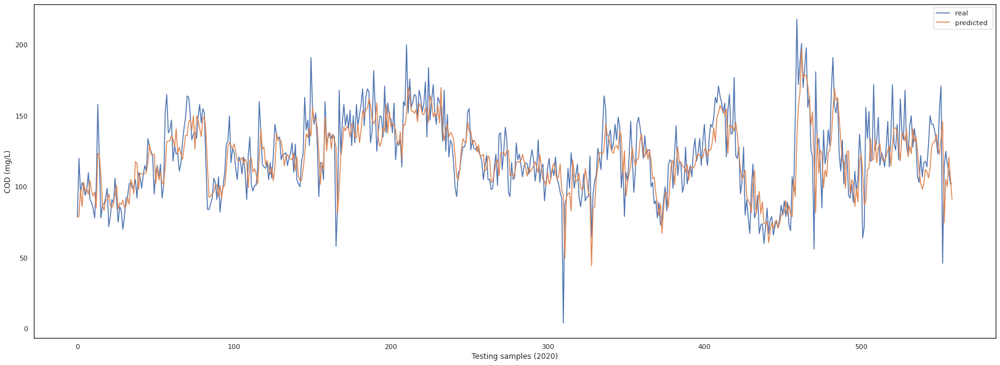

In [104]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [105]:
ensemble_model3.selection.to_list().count(1)

486

## Testing


*** ANN estimation ***
MAPE:  17.94289452514729
R2:  0.20358113828322477
RMSE:  18.07347767499174


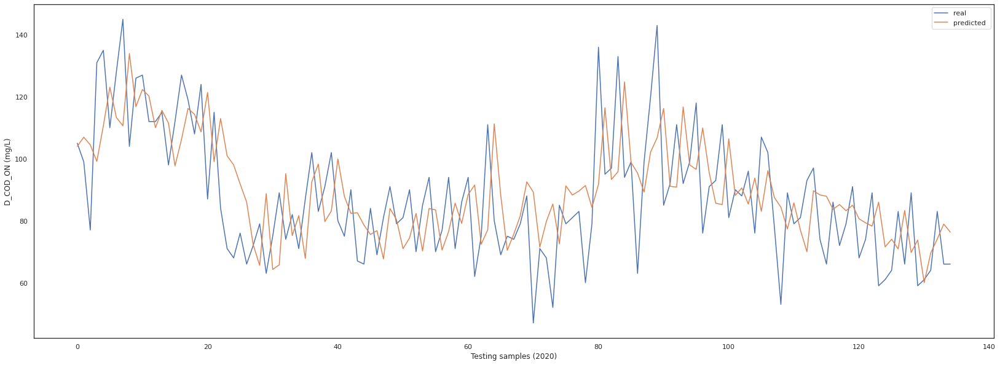

(135,)

In [106]:
app1.testing(dataset.iloc[-(cut_off + 7):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  28.96650087762999
R2:  -0.38034428497737305
RMSE:  23.79384725241922


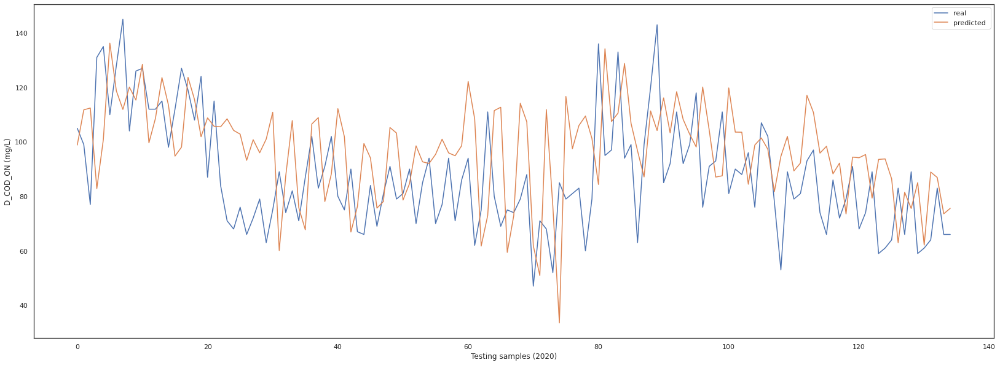

(135, 1)

In [107]:
app2.testing(dataset.iloc[-(cut_off+2):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  22.210052012437448
R2:  -0.11115578196515585
RMSE:  21.348060934250206


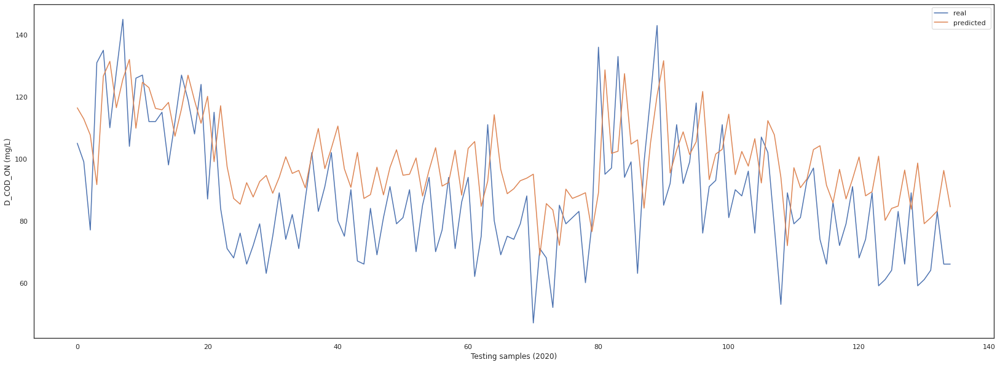

(135,)

In [108]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  20.094839243618285
R2:  0.06332255723155322


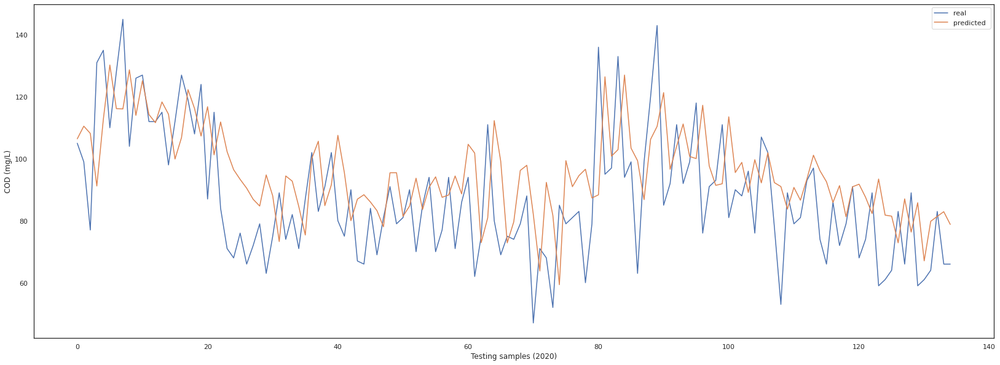

In [109]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[25.059647 35.090958 36.242355 17.564487 30.64136  66.62955  43.17128
 35.584793 44.84327  39.348576 59.413136 31.378445 31.903194 49.969414
 36.288826 21.219007 25.521675 50.415157 38.460514 27.115492 37.504066
 30.715916 31.717915 32.67588  28.470861 27.832207 21.0658   21.634106
 18.371595 26.662594 22.19791  31.959412 18.296352 24.478579 18.701218
 23.626106 29.972988 32.228664 18.012997 18.246868 34.608124 26.414644
 23.797579 18.823072 23.239916 20.207085 18.94161  17.889572 26.392725
 23.28218  17.9183   17.598667 22.405373 18.776115 20.077765 21.183157
 20.772743 20.641476 21.293703 22.951048 35.984455 29.741932 28.491238
 19.933735 34.853153 31.22918  31.745604 19.826746 29.214832 30.929193
 22.552832 38.63945  27.47052  17.98666  53.468166 33.855473 24.54767
 28.893045 30.940765 24.986567 17.81427  63.19136  30.676323 33.32147
 57.704704 31.064438 22.488472 18.740244 35.383068 29.17694  38.9139
 28.643227 34.759804 32.711407

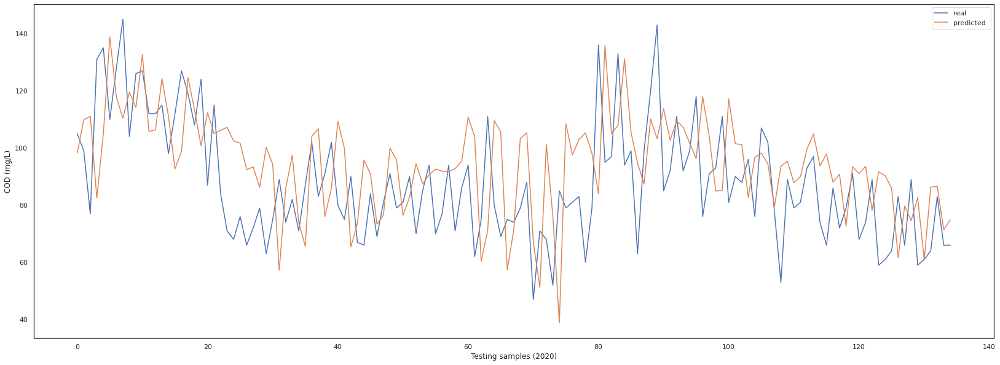

In [110]:
ensemble_model.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[33.29077  35.128166 35.089226 18.014713 39.879654 69.24073  43.654816
 39.895855 50.638588 38.670635 56.619816 38.86674  33.794506 49.402058
 37.876324 23.766413 33.310375 52.464233 39.745487 28.520739 38.07381
 27.738878 34.153748 30.670774 25.828335 24.400043 19.524778 22.919027
 22.633703 23.878977 33.91392  17.721962 19.533443 30.496239 18.125504
 17.608843 29.05645  32.514286 18.208097 20.852869 35.623417 25.269571
 17.413609 21.228342 21.960857 20.090824 18.540888 17.554218 27.2094
 28.741133 17.523666 18.158295 23.88209  18.741537 19.30346  23.84999
 23.534952 20.313038 22.698132 20.897934 48.535275 31.606134 19.798853
 17.413734 33.72206  35.53853  17.682535 17.507357 37.19218  29.10614
 19.753061 28.771332 32.71168  18.56393  24.883219 37.025684 19.144365
 25.516329 29.005932 21.978535 17.413403 69.19403  28.620392 31.416815
 56.98116  29.432976 23.562515 17.961628 33.005177 35.166428 48.894974
 24.27905  41.93241  29.596827

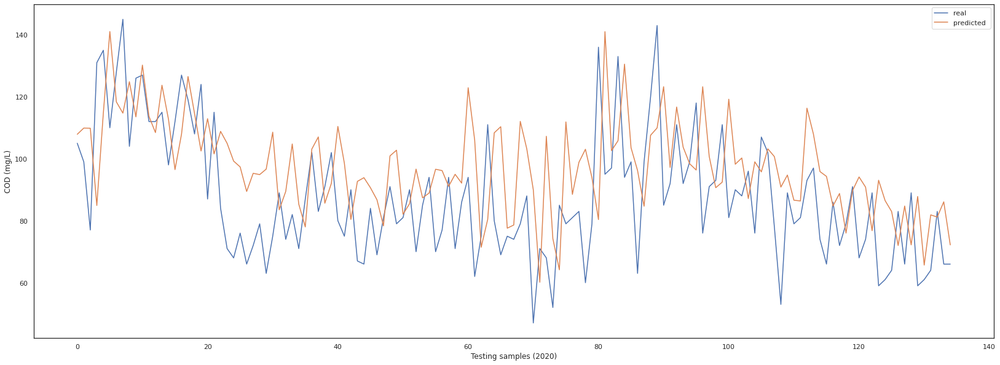

In [111]:
ensemble_model2.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

     D_COD_ON    model1    model2    model3
0   -0.232714 -0.856191 -1.054331 -0.245489
1   -0.586019 -0.713357 -0.427216 -0.438496
2   -0.798002 -0.834463 -0.394622 -0.717326
3   -1.575273 -1.092545 -1.832235 -1.575292
4    0.332575 -0.538459 -0.958398  0.304205
..        ...       ...       ...       ...
130 -2.211222 -2.989241 -2.839141 -2.250474
131 -2.140561 -2.525114 -1.536873 -2.148840
132 -2.034570 -2.306942 -1.633067 -2.029214
133 -1.363290 -2.072396 -2.280550 -1.329040
134 -1.963909 -2.198102 -2.183186 -1.959471

[135 rows x 4 columns]      0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  1  0
4    0  1  0
..  .. .. ..
554  0  0  1
555  1  0  0
556  1  0  0
557  0  1  0
558  1  0  0

[559 rows x 3 columns]
5/5 [==============================] - 0s 2ms/step - loss: 1.1053 - accuracy: 0.4667
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(19.442690669638974, shape=(), dtype=float64)
MAPEsci:  1626.8539459252893
MAPE:  19.442690669638964
R2:  0.0035439938228186696
RMSE:

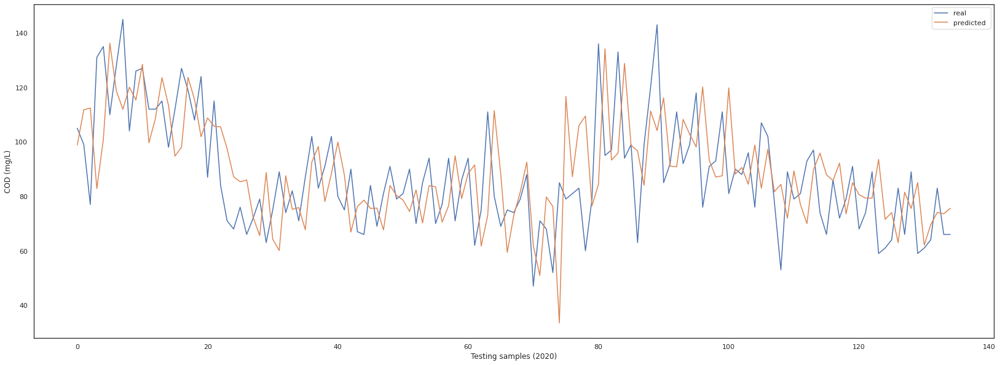

In [112]:
ensemble_model3.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [113]:
ensemble_model3.selection.to_list().count(3)

0

# EQ_COD

In [114]:
active_target = "EQ_COD"
# dataset = dataset2.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701 entries, 0 to 700
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Flow_efl    701 non-null    float64
 1   BT_C_MLSS   701 non-null    float64
 2   BT_C_MVLSS  701 non-null    float64
 3   BT_N_MLSS   701 non-null    float64
 4   BT_N_MVLSS  701 non-null    float64
 5   D_SS        701 non-null    float64
 6   EQ_N        701 non-null    float64
 7   BT_C_N      701 non-null    float64
 8   BT_N_N      701 non-null    float64
 9   D_N         701 non-null    float64
 10  OxT_PH_PM   701 non-null    float64
 11  EQ_PH       701 non-null    float64
 12  BT_N_PH     701 non-null    float64
 13  D_PH        701 non-null    float64
 14  BT_N_DO     701 non-null    float64
 15  BT_C_DO     701 non-null    float64
 16  Clari_DO    701 non-null    float64
 17  F/M         701 non-null    float64
 18  ST_COD      688 non-null    float64
 19  EQ_COD      701 non-null    f

## Approach 1

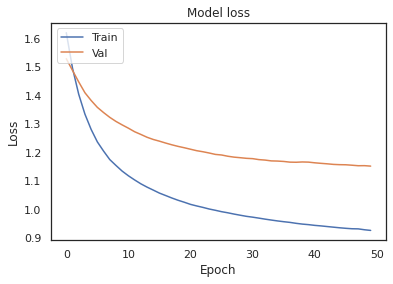

*** ANN estimation ***
MAPE:  8.065241554676405
R2:  0.51190951024298
RMSE:  36.75574217367112


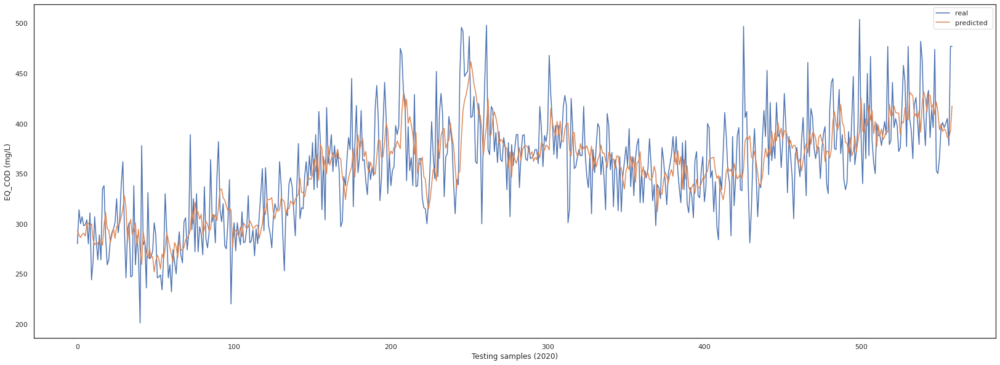

(559,)

In [115]:
# cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

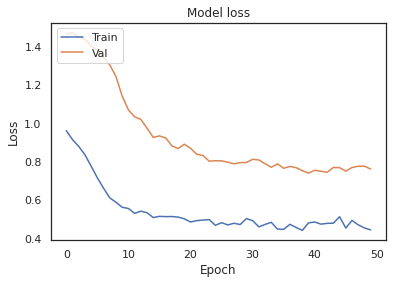

*** LSTM estimation ***
MAPE:  14.687700751013253
R2:  0.5522639392789876
RMSE:  35.203517554646034


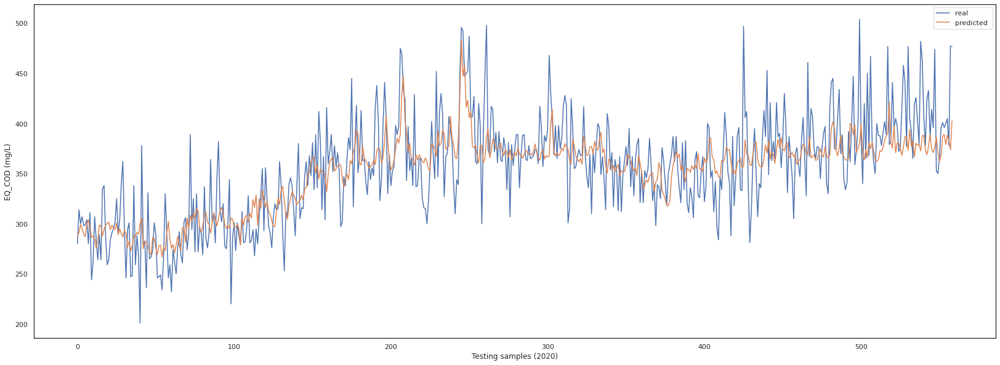

(559, 1)

In [116]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=2)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[5:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE:  7.872719905621193
R2:  0.5339827802841193
RMSE:  35.9150111736966


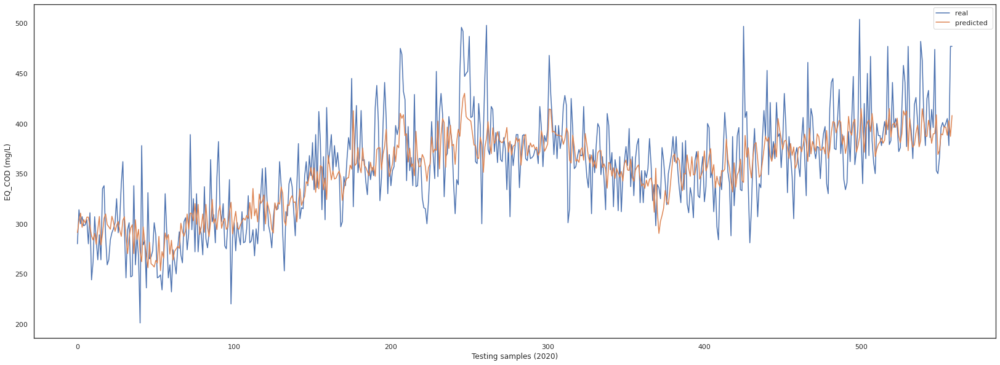

(559,)

In [117]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

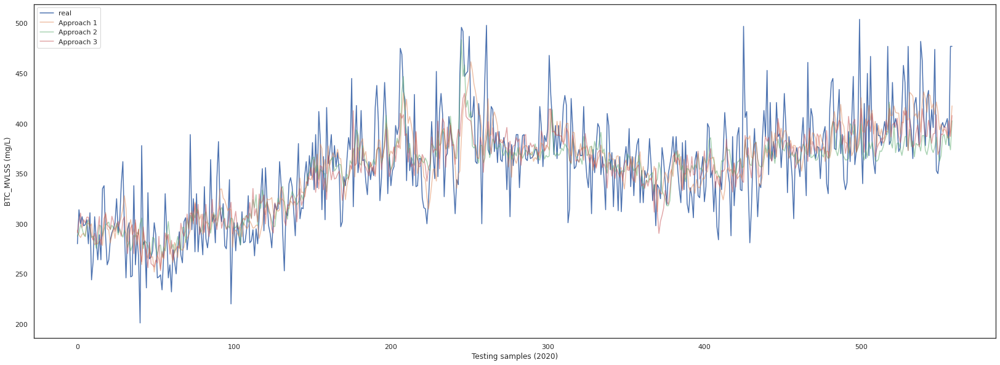

In [118]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [119]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0       872.314867
1       882.374222
2       896.141284
3       880.965481
4       883.778684
          ...     
554    1168.039869
555    1163.182736
556    1171.759073
557    1153.722757
558    1228.408095
Length: 559, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  7.767722014364031
R2:  0.5485463377059616
RMSE:  35.349364765988206


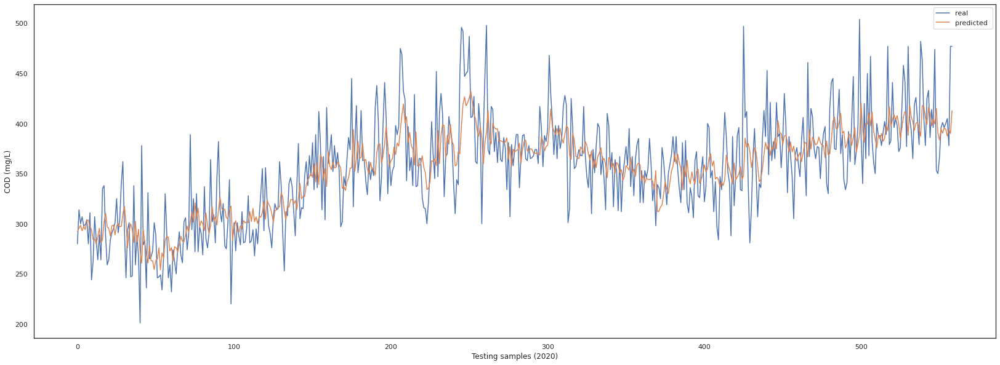

In [120]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  7.560302669531143
R2:  0.5662286582570019
RMSE:  34.65017653016058


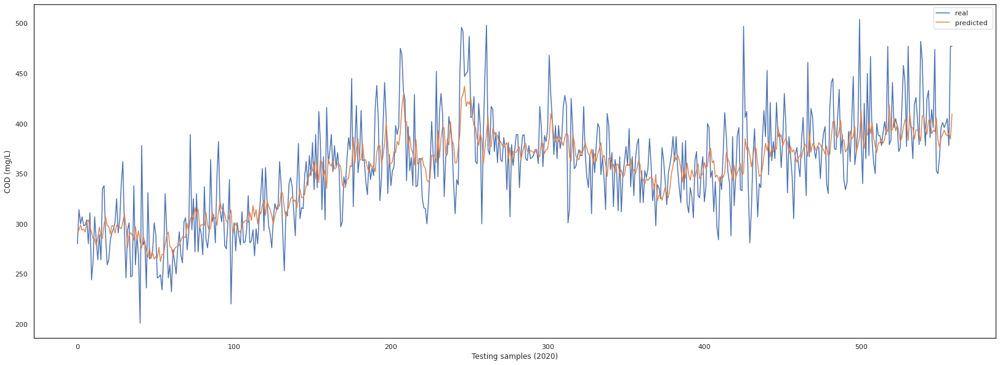

In [121]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

In [122]:
class Ensemble:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[['model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[['model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 1s 11ms/step - loss: 0.4893 - MAPE: 150.9363 - val_loss: 0.8050 - val_MAPE: 94.8643
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4577 - MAPE: 165.8586 - val_loss: 0.7188 - val_MAPE: 101.6248
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4381 - MAPE: 181.1377 - val_loss: 0.6914 - val_MAPE: 104.3938
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4283 - MAPE: 195.9460 - val_loss: 0.6543 - val_MAPE: 108.9578
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4232 - MAPE: 201.1622 - val_loss: 0.6482 - val_MAPE: 110.1627
Epoch 6/50
16/16 [==============================] - 0s 3ms/step - loss: 0.4210 - MAPE: 207.6063 - val_loss: 0.6329 - val_MAPE: 112.7316
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4195 - MAPE: 209.6022 - val_loss: 0.6326 - val_MAPE: 112.9757
Epoch 8/50
16/16 [==============================

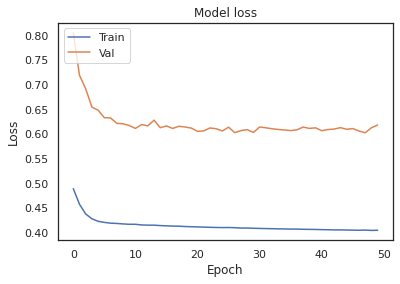

In [123]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[18.809198  18.033333  16.9064    17.892048  18.088314  18.607698
 16.548485  16.157066  17.463047  19.048096  19.626448  19.876722
 21.611809  19.68346   17.214062  18.776009  19.564394  17.181414
 16.371117  17.000534  17.035778  18.462132  17.048979  17.327072
 18.340107  16.93125   18.075695  17.593105  18.40016   18.226826
 17.033108  18.340141  22.006773  19.783007  20.939987  20.061083
 19.982584  18.285484  19.400803  18.386932  19.353632  18.892653
 20.61017   20.53769   22.083658  23.58891   22.270893  24.493847
 22.169144  23.23906   23.550795  24.347855  21.632757  24.244673
 23.873951  23.121183  21.48513   18.966333  17.728836  21.167032
 21.963371  23.088114  22.707552  21.610107  20.892841  21.420986
 20.865887  18.687613  18.740019  19.869576  16.38051   17.990202
 15.83111   15.92376   15.7596245 15.161626  15.21111   14.638352
 17.622326  17.798338  16.974491  16.549915  15.001578  16.836946
 17.780893  17.868034  1

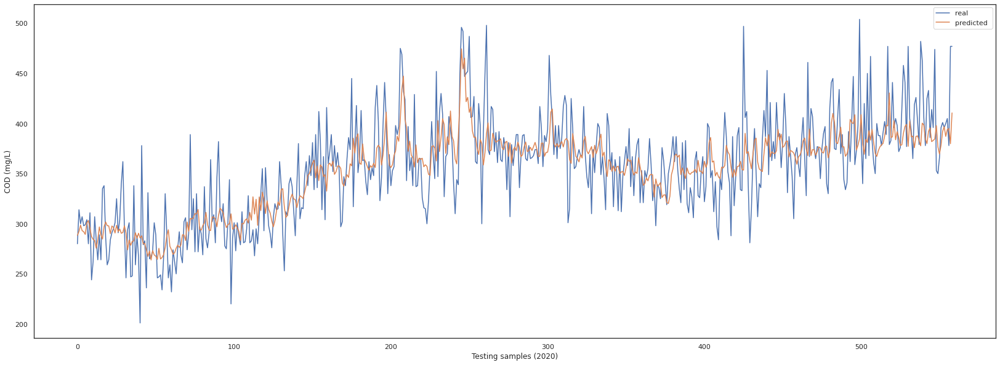

In [124]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


In [125]:
class Ensemble2:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[[self.goal, 'model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 0s 10ms/step - loss: 0.5656 - MAPE: 173.1693 - val_loss: 1.2957 - val_MAPE: 92.8750
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5398 - MAPE: 163.0930 - val_loss: 1.2220 - val_MAPE: 91.1937
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5163 - MAPE: 164.4373 - val_loss: 1.1626 - val_MAPE: 90.2131
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 0.5015 - MAPE: 162.9171 - val_loss: 1.0970 - val_MAPE: 89.3001
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4842 - MAPE: 167.3621 - val_loss: 1.0474 - val_MAPE: 89.3081
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4723 - MAPE: 171.1847 - val_loss: 0.9935 - val_MAPE: 89.8738
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 0.4607 - MAPE: 172.2665 - val_loss: 0.9466 - val_MAPE: 90.4134
Epoch 8/50
16/16 [==============================] - 0s

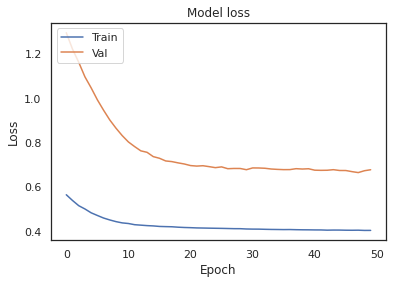

In [126]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[18.868206  18.377758  17.550259  18.388624  18.6443    19.21252
 16.766773  16.362862  17.449081  19.197697  19.365292  20.213642
 22.612038  20.406843  17.447311  19.075638  19.907495  17.686214
 16.33483   17.114346  16.793898  18.702585  17.421404  17.562454
 18.872185  17.149675  18.384151  17.579758  18.096682  17.53238
 16.132425  17.395554  21.775665  19.666061  19.98927   19.631546
 19.338364  18.380693  19.532616  18.595495  19.55666   18.314972
 21.214394  20.969252  22.843817  23.57512   23.602144  25.18142
 22.60045   24.388903  25.024302  25.426945  22.305567  24.825304
 24.324163  23.255327  22.216022  19.751152  18.109951  21.05265
 22.676186  23.266113  23.057228  21.880543  21.295027  21.740799
 21.808247  19.203613  18.969362  20.645472  16.980814  18.121443
 16.047169  16.61985   15.781361  14.805327  14.724951  14.772036
 17.201328  17.334803  17.421865  16.297514  15.327295  16.768026
 17.678942  18.188375  15.93

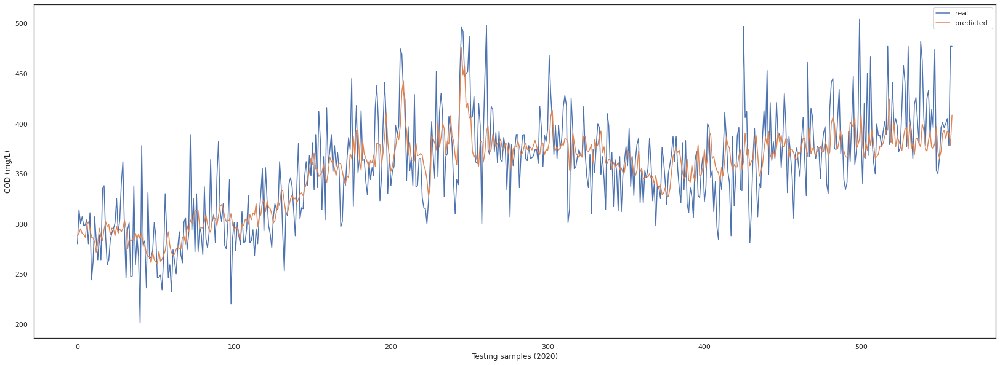

In [127]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

In [128]:
class Ensemble3:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
  

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
 
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 16, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons/2, activation='relu', input_dim = self.X_train.shape[1]))
    self.model.add(Dense(neurons, activation='relu'))
    self.model.add(Dense(3, activation='softmax'))

    print(self.Y_train.shape)
    print(self.X_train.shape)

    self.model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df_test['model1'] - self.df_test['target'])
    model2 = abs(self.df_test['model2'] - self.df_test['target'])
    model3 = abs(self.df_test['model3'] - self.df_test['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Yt = pd.get_dummies(temp)   

    self.Y_test = self.Yt
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.score = self.model.evaluate(self.X_test, self.Y_test)
    self.prediction = self.model.predict(self.X_test)
    
    self.full_prediction = np.zeros(len(self.prediction))
    self.selection = pd.DataFrame(self.prediction).idxmax(axis=1)

    
    for i in range(len(self.prediction)):
      self.full_prediction[i] = self.df_test[f'model{int(self.selection[i])+1}'][i]
    # print(self.full_prediction)

    self.Ys_test = self.df_test['target']
    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('MAPEsci: ',mean_absolute_error(self.Ys_test, self.full_prediction)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('R2: ',r2_score(self.Ys_test, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Ys_test, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Ys_test, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

     0  1  2
0    0  1  0
1    0  0  1
2    0  1  0
3    0  0  1
4    0  0  1
..  .. .. ..
554  0  0  1
555  0  1  0
556  0  1  0
557  1  0  0
558  1  0  0

[559 rows x 3 columns]
(559, 3)
(559, 4)
Epoch 1/50
16/16 [==============================] - 1s 11ms/step - loss: 1.1193 - accuracy: 0.3419 - val_loss: 1.1140 - val_accuracy: 0.2679
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1093 - accuracy: 0.3320 - val_loss: 1.1065 - val_accuracy: 0.2679
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 1.1046 - accuracy: 0.3260 - val_loss: 1.1013 - val_accuracy: 0.3036
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1009 - accuracy: 0.3439 - val_loss: 1.0997 - val_accuracy: 0.3036
Epoch 5/50
16/16 [==============================] - 0s 3ms/step - loss: 1.0991 - accuracy: 0.3638 - val_loss: 1.0971 - val_accuracy: 0.2500
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 1.0972 - accuracy: 0.3658 - v

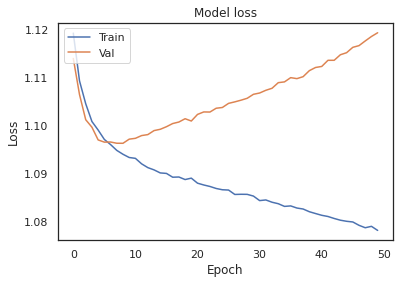

In [129]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

18/18 [==============================] - 0s 1ms/step - loss: 1.0815 - accuracy: 0.3631
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(7.6784519440037045, shape=(), dtype=float64)
MAPEsci:  2698.921850737581
MAPE:  7.678451944003714
R2:  0.55377208415394
RMSE:  35.144178143326954


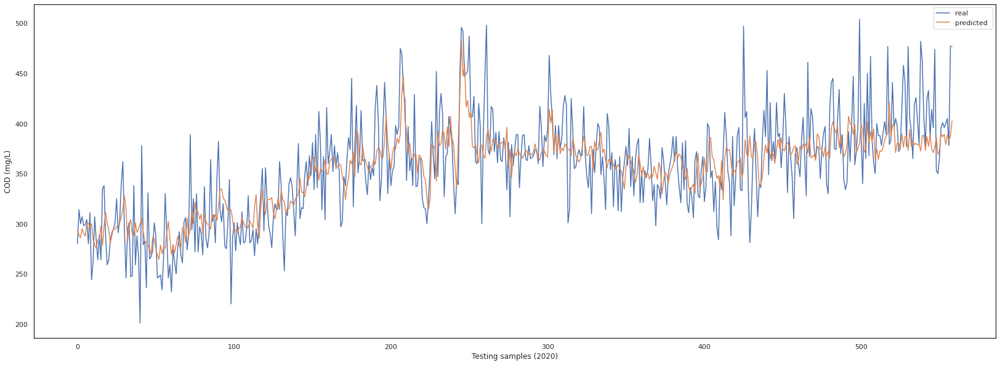

In [130]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [131]:
ensemble_model3.selection.to_list().count(1)

323

### Ensemble 4

In [132]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [133]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

## Testing


*** ANN estimation ***
MAPE:  9.619683069772691
R2:  0.06770452287982176
RMSE:  46.47057129046076


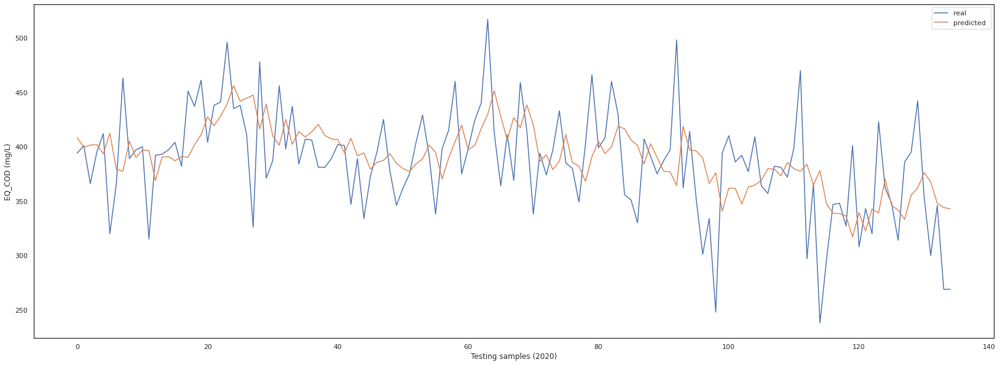

(135,)

In [134]:
app1.testing(dataset.iloc[-(cut_off + 7):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  11.456409161674449
R2:  -0.0753991809347736
RMSE:  49.90982804376748


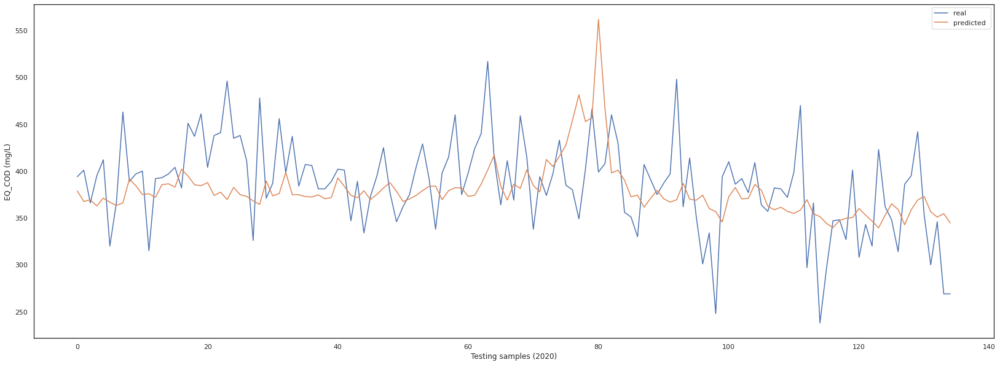

(135, 1)

In [135]:
app2.testing(dataset.iloc[-(cut_off + 2):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  9.174676890714874
R2:  0.13441727393677294
RMSE:  44.77705364203506


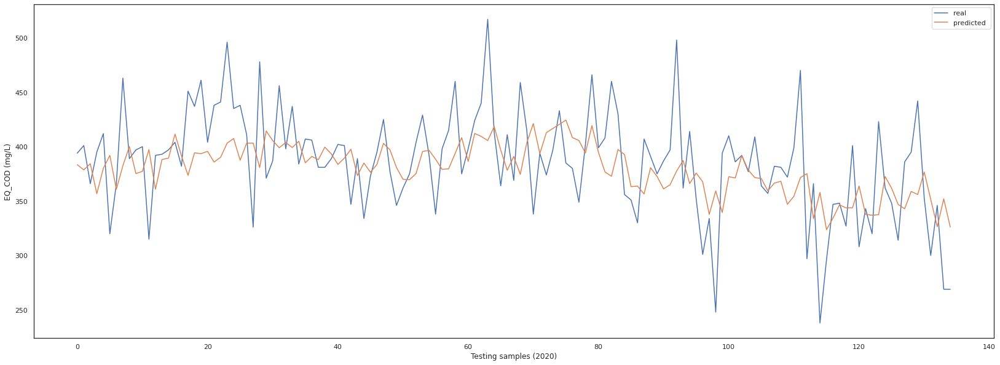

(135,)

In [136]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  9.120713363934161


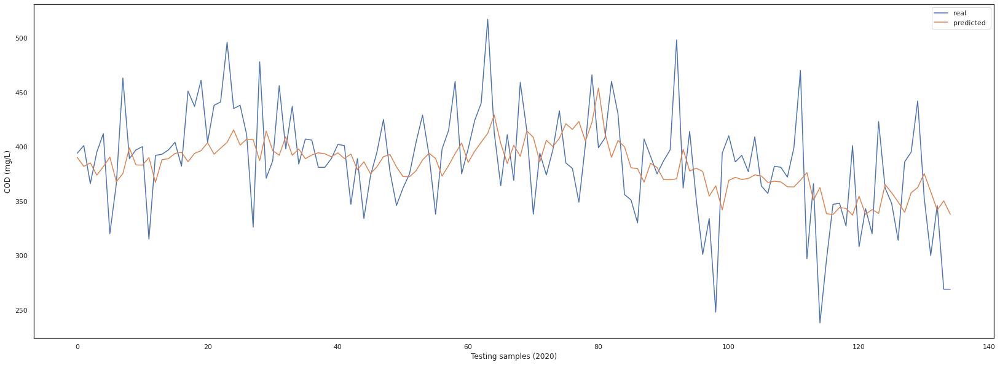

In [137]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 9.837588  10.137078  10.005104  10.692381  10.068234   9.908518
 10.910931  10.320805  10.280305   9.823459   9.99267    9.828215
 10.472815   9.8732395  9.905855  10.187869  11.047483   9.91934
  9.879501   9.862163  10.04343    9.839897   9.829625   9.843031
 10.448662   9.83068    9.903629   9.854152  10.056748  10.827264
  9.826683   9.817893  10.810661   9.820795   9.836749   9.88601
  9.845259   9.826216   9.830427   9.853996   9.964566   9.833925
  9.821042  10.164664   9.854721  10.252048   9.922498   9.9521885
 10.07034    9.861053  10.514665  10.353151  10.085519   9.824049
  9.863095   9.833741  10.115689   9.872434   9.829643  10.018235
  9.928113   9.837316  10.15658   11.122942  13.84636    9.963751
 10.047154   9.9356365  9.828852  11.227677  10.4544     9.817877
 13.800936  13.073935  14.8398075 17.000748  19.814877  24.500694
 18.250727  21.415373  39.193405  19.092678  10.028149  10.942118
  9.980621  10.140417  10

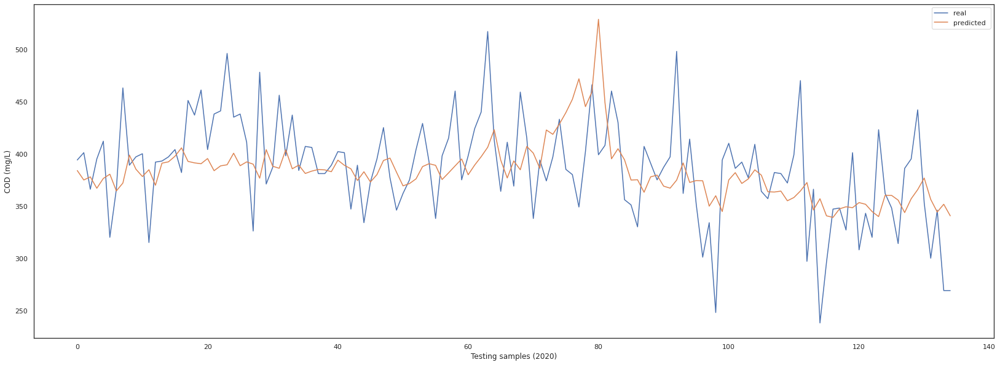

In [138]:
ensemble_model.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 9.874898  10.303138  10.144944  11.79167   10.084383  10.114036
 11.661313  10.304018  10.265478   9.819664   9.985759   9.858141
 10.740928   9.834496   9.852762   9.882411  10.780067   9.979905
  9.910347   9.845265   9.836988  10.038388  10.037908  10.182655
  9.966014  10.614265  10.071591  10.225898  11.035499  10.264302
  9.970212   9.874359  10.643054   9.881268   9.824862  10.093954
 10.026552  10.003769  10.087724  10.071122   9.910732   9.825413
  9.920541  10.219355   9.856502  10.272486   9.94924    9.836552
  9.965598   9.869909  10.419588  10.228668  10.028396   9.818002
  9.854928   9.821352  10.214003   9.851879   9.819825   9.913262
 10.041561   9.850856   9.902288  10.734331  13.432561   9.818146
 10.383749   9.819321   9.898491  10.7533245  9.895858   9.891881
 12.367551  11.547158  13.170751  14.96402   19.096668  24.719889
 18.75183   19.879679  42.471367  20.883114  10.126623  10.854714
  9.93504   10.303885  1

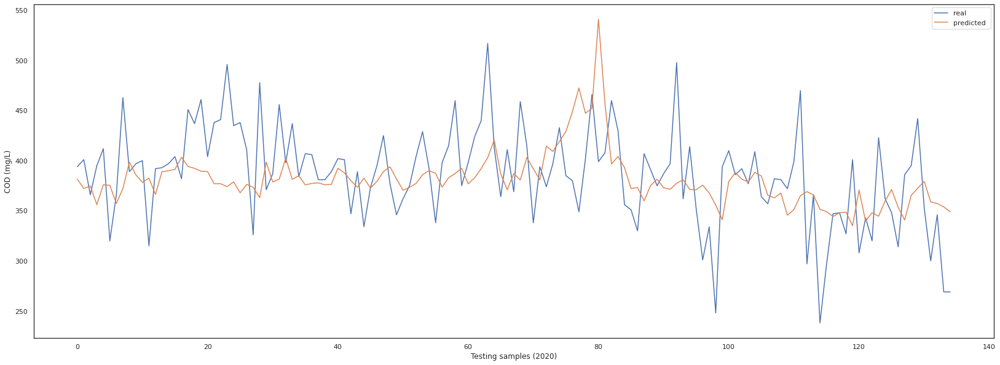

In [139]:
ensemble_model2.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

5/5 [==============================] - 0s 2ms/step - loss: 1.1558 - accuracy: 0.3111
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(9.94615941153601, shape=(), dtype=float64)
MAPEsci:  3772.2493335132467
MAPE:  9.946159411536014
R2:  -0.06459827860061607
RMSE:  49.658557824861056


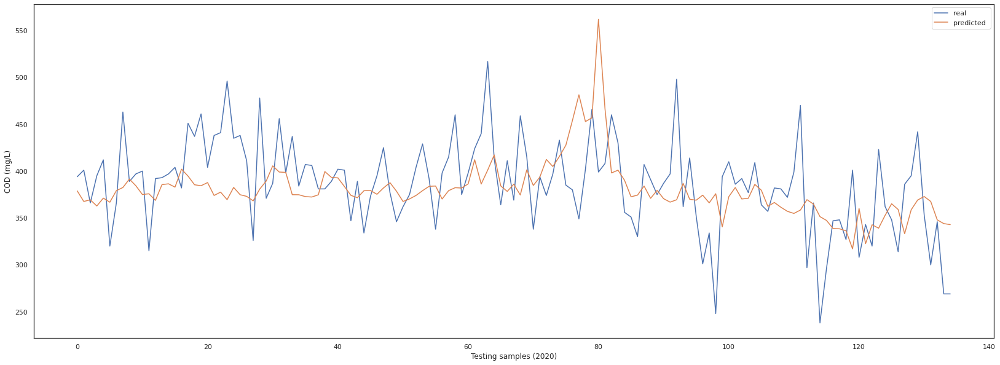

In [140]:
ensemble_model3.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [141]:
ensemble_model3.selection.to_list().count(3)

0

# D_COD_ON

In [142]:
active_target = "D_COD_ON"
# dataset = dataset2.copy()
dataset.shape
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 701 entries, 0 to 700
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Flow_efl    701 non-null    float64
 1   BT_C_MLSS   701 non-null    float64
 2   BT_C_MVLSS  701 non-null    float64
 3   BT_N_MLSS   701 non-null    float64
 4   BT_N_MVLSS  701 non-null    float64
 5   D_SS        701 non-null    float64
 6   EQ_N        701 non-null    float64
 7   BT_C_N      701 non-null    float64
 8   BT_N_N      701 non-null    float64
 9   D_N         701 non-null    float64
 10  OxT_PH_PM   701 non-null    float64
 11  EQ_PH       701 non-null    float64
 12  BT_N_PH     701 non-null    float64
 13  D_PH        701 non-null    float64
 14  BT_N_DO     701 non-null    float64
 15  BT_C_DO     701 non-null    float64
 16  Clari_DO    701 non-null    float64
 17  F/M         701 non-null    float64
 18  ST_COD      688 non-null    float64
 19  EQ_COD      701 non-null    f

## Approach 1

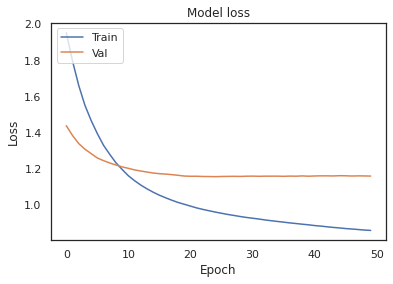

*** ANN estimation ***
MAPE * Founded
MAPE:  17.443953525468334
R2:  0.42061909532903263
RMSE:  21.109222757511358


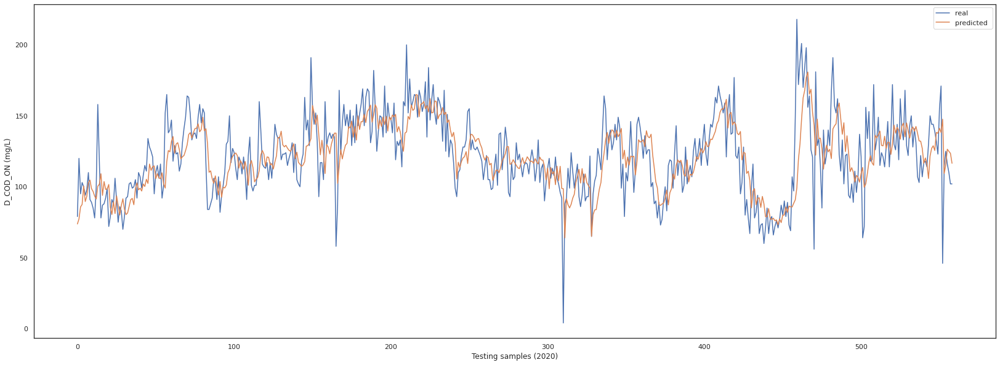

(559,)

In [143]:
# cut_off = 68
app1 = approach1(dataset.iloc[:-cut_off], active_target)
# app1.tune()
# print(app1.best_tuned)
# with open('EQ_COD1.pickle', 'wb') as handle:
#   pickle.dump(app1.best_tuned, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('EQ_COD_tuning_1.pickle', 'wb') as handle:
#   pickle.dump(app1.tune_results, handle, protocol=pickle.HIGHEST_PROTOCOL)
app1.training()
app1.testing(dataset.iloc[:-cut_off])
# app1.testing(dataset.iloc[-142:])
app1.full_prediction.shape

## Approach 2

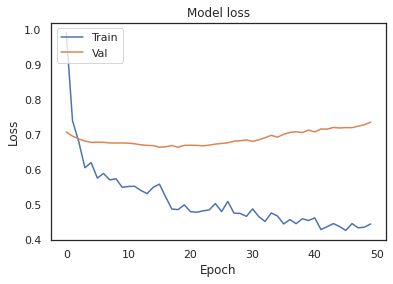

*** LSTM estimation ***
MAPE * Founded
MAPE:  29.332704844978153
R2:  0.5773499113822091
RMSE:  18.029373521473275


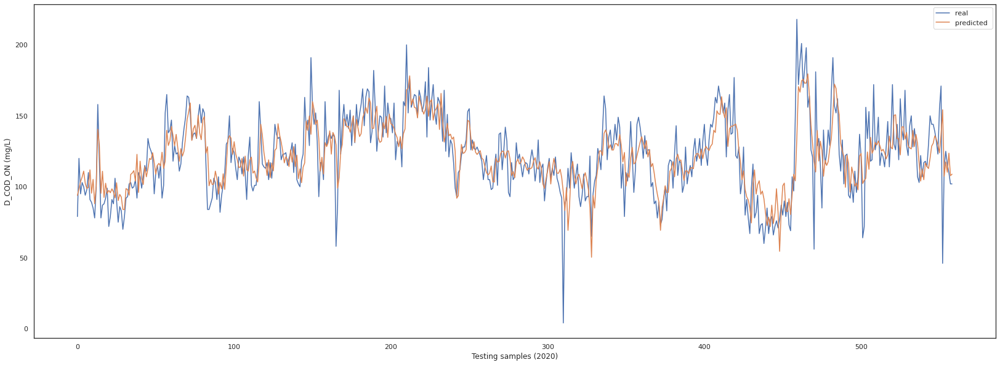

(559, 1)

In [144]:
app2 = approach2(dataset.iloc[:-cut_off], active_target)
app2.series_to_supervised(n_in=2)
app2.supervised
app2.training()
# app2.testing(dataset.iloc[-137:])
app2.testing(dataset.iloc[5:-cut_off])
app2.full_prediction.shape

## Approach 3

*** Delta estimation ***
MAPE * Founded
MAPE:  17.446169623289794
R2:  0.4531540599592928
RMSE:  20.507968898805927


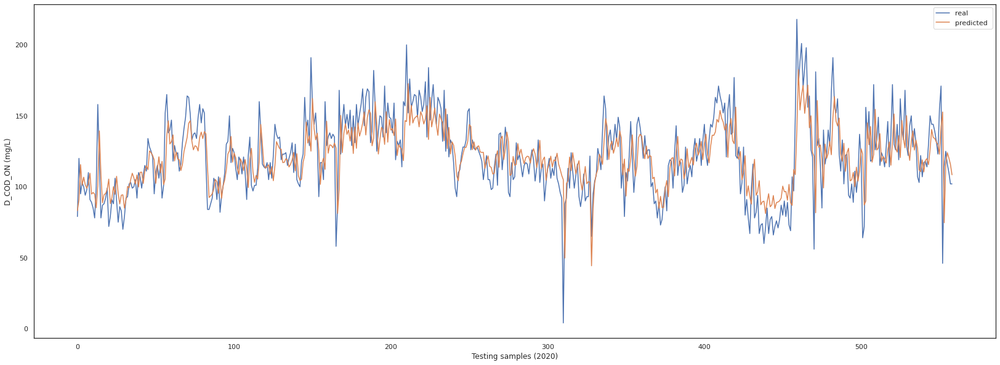

(559,)

In [145]:
app3 = approach3(dataset.iloc[:-cut_off], active_target)
app3.training()
app3.testing(dataset.iloc[7:-cut_off])
# app3.testing(dataset.iloc[-135:])
app3.full_prediction.shape

## Approaches

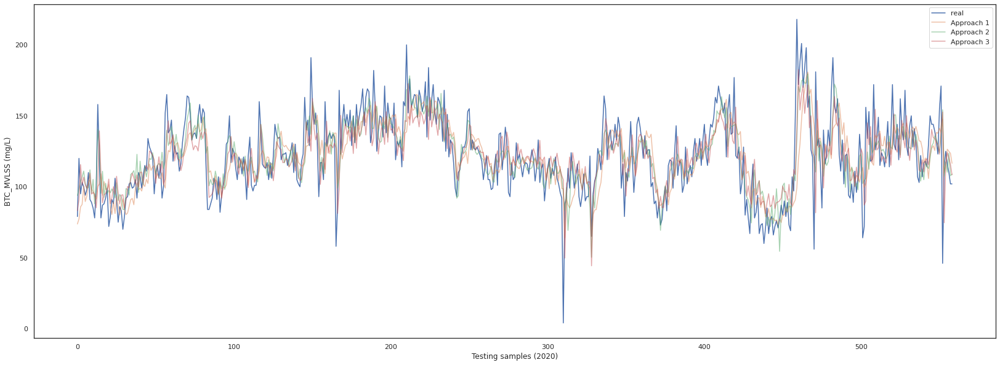

In [146]:
plt.figure(figsize=(28,10))
plt.plot(app1.Y_test.values, label = 'real ')
plt.plot(app1.full_prediction,'-', alpha= 0.5, label = 'Approach 1')
plt.plot(app2.full_prediction['Prediction'], alpha= 0.5, label = 'Approach 2')
plt.plot(app3.full_prediction, alpha= 0.5, label = 'Approach 3')
plt.ylabel('BTC_MVLSS (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

## Ensemble

In [147]:
app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction

0      250.811552
1      266.929564
2      304.946054
3      295.422319
4      318.261517
          ...    
554    348.657175
555    360.697249
556    368.888457
557    347.083742
558    333.795580
Length: 559, dtype: float64

### Ensemble AVG

*** Ensemble estimation ***
MAPE:  16.826547341180174
R2:  0.47888017284482864
RMSE:  20.019763959053986


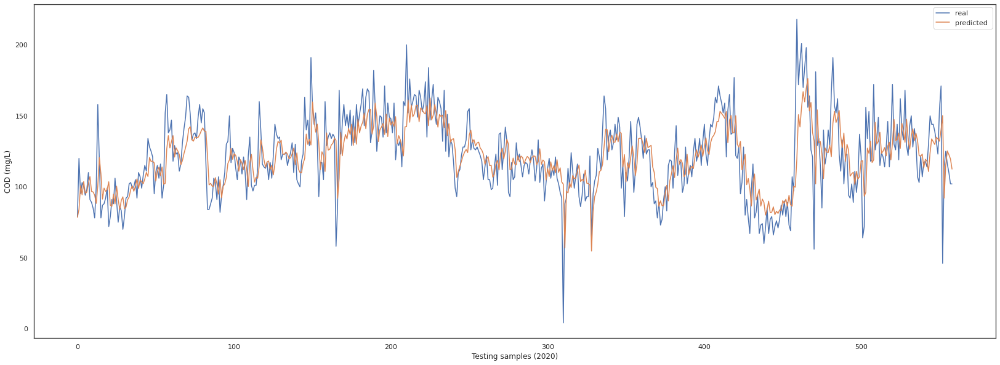

In [148]:
ensemble = (app1.full_prediction + app3.full_prediction)/2
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** Ensemble estimation ***
MAPE:  16.11379548068144
R2:  0.5328742806750095
RMSE:  18.954269175999855


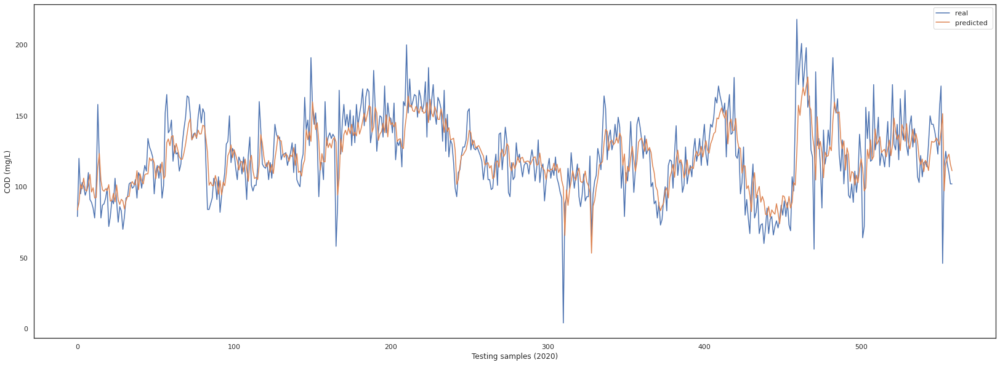

In [149]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble))
print ('R2: ',r2_score(app2.Y_test.values, ensemble))
print ('RMSE: ',mean_squared_error(app2.Y_test.values, ensemble, squared=False))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

### Ensemble 1 - Model Fusion

In [150]:
class Ensemble:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[['model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[['model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 1s 10ms/step - loss: 1.8400 - MAPE: 208.1658 - val_loss: 0.7393 - val_MAPE: 234.1612
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 1.6273 - MAPE: 196.7108 - val_loss: 0.7262 - val_MAPE: 222.1551
Epoch 3/50
16/16 [==============================] - 0s 2ms/step - loss: 1.4334 - MAPE: 184.0791 - val_loss: 0.7203 - val_MAPE: 216.5309
Epoch 4/50
16/16 [==============================] - 0s 2ms/step - loss: 1.2502 - MAPE: 181.2186 - val_loss: 0.7203 - val_MAPE: 215.3393
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 1.0975 - MAPE: 178.8335 - val_loss: 0.7270 - val_MAPE: 213.7977
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 0.9606 - MAPE: 178.4251 - val_loss: 0.7374 - val_MAPE: 214.5135
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 0.8528 - MAPE: 183.9688 - val_loss: 0.7500 - val_MAPE: 215.4264
Epoch 8/50
16/16 [=============================

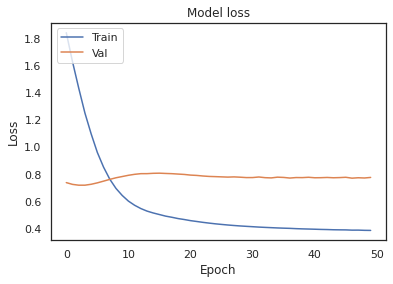

In [151]:
ensemble_model = Ensemble(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[1.68213280e+08 1.75568448e+08 1.66149360e+08 1.89388416e+08
 1.94796544e+08 1.74915120e+08 1.67646048e+08 1.72474352e+08
 1.94208432e+08 1.70322016e+08 1.87144416e+08 1.54610576e+08
 1.84331936e+08 2.64283904e+08 2.39076768e+08 1.63918800e+08
 2.12410944e+08 1.69641632e+08 1.80722720e+08 1.66533184e+08
 1.64759856e+08 1.68469456e+08 1.73119280e+08 1.60270912e+08
 1.53281616e+08 1.69876944e+08 1.52765232e+08 1.64736608e+08
 1.57963328e+08 1.47307344e+08 1.51418480e+08 1.74837072e+08
 1.63710304e+08 1.54838400e+08 1.90950480e+08 1.89827072e+08
 1.98887968e+08 1.77300192e+08 2.30079168e+08 1.65425216e+08
 2.14012272e+08 1.75850288e+08 1.74799040e+08 2.01006256e+08
 1.74043568e+08 1.95122704e+08 2.11975248e+08 2.08287248e+08
 2.23470704e+08 2.01658800e+08 1.91038096e+08 2.00283472e+08
 1.99993936e+08 2.02404192e+08 2.26299296e+08 2.05171152e+08
 2.18184272e+08 2.62093680e+08 2.47369520e+08 2.47341168e+08
 2.57397824e+08 2.50500432e+08 2.

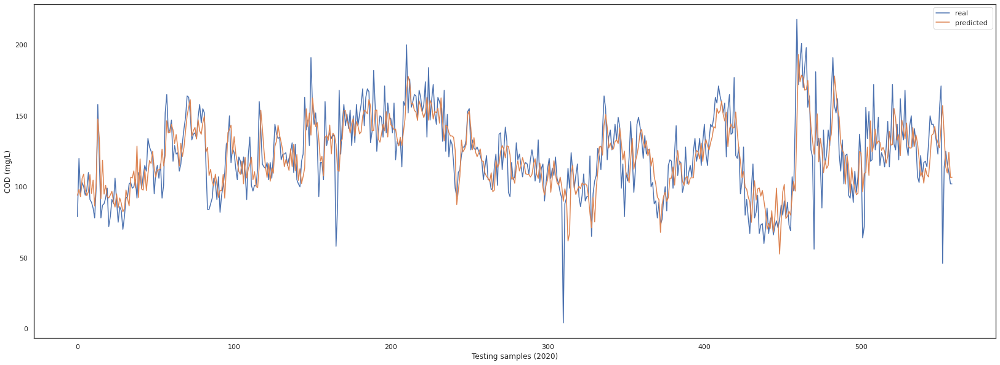

In [152]:
ensemble_model.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 2 - Model Fusion + Exo


In [153]:
class Ensemble2:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)
    
    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3

    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')

    self.X = self.df[[self.goal, 'model1', 'model2', 'model3']]
    self.Y = self.df['target'] 
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    self.y_mean = self.Y.mean()
    self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)  
  
    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
  
  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons, activation='relu', input_dim= self.X_train.shape[1]))
    self.model.add(Dense(1))

    self.model.compile(optimizer= 'adam', loss='mse', metrics=['MAPE'])    
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')
  
  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')
    
    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target'] 
    # print(self.Xt)
  
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)
    
    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean
    

    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    # print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

Epoch 1/50
16/16 [==============================] - 1s 10ms/step - loss: 2.5863 - MAPE: 292.4994 - val_loss: 1.3644 - val_MAPE: 376.1237
Epoch 2/50
16/16 [==============================] - 0s 2ms/step - loss: 2.1983 - MAPE: 269.1940 - val_loss: 1.1990 - val_MAPE: 339.7455
Epoch 3/50
16/16 [==============================] - 0s 3ms/step - loss: 1.8831 - MAPE: 253.2218 - val_loss: 1.0663 - val_MAPE: 304.8676
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 1.6255 - MAPE: 232.6383 - val_loss: 0.9585 - val_MAPE: 271.7633
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 1.4149 - MAPE: 213.8649 - val_loss: 0.8806 - val_MAPE: 247.6369
Epoch 6/50
16/16 [==============================] - 0s 2ms/step - loss: 1.2447 - MAPE: 200.1950 - val_loss: 0.8199 - val_MAPE: 228.3274
Epoch 7/50
16/16 [==============================] - 0s 2ms/step - loss: 1.1127 - MAPE: 185.6850 - val_loss: 0.7720 - val_MAPE: 209.8184
Epoch 8/50
16/16 [=============================

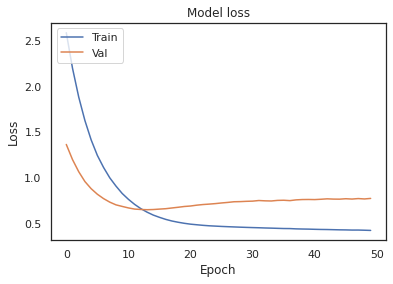

In [154]:
ensemble_model2 = Ensemble2(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model2.training()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[1.5870546e+08 1.6737158e+08 1.9111621e+08 1.8763309e+08 2.0008739e+08
 1.8860221e+08 1.8118272e+08 1.8163382e+08 2.0743674e+08 1.7735301e+08
 1.8773712e+08 1.5868179e+08 1.8026926e+08 2.3128717e+08 2.1290533e+08
 1.7698944e+08 1.8931989e+08 1.6617699e+08 1.8458381e+08 1.7408957e+08
 1.7368594e+08 1.6148104e+08 1.6678885e+08 1.7208314e+08 1.6689242e+08
 1.9050163e+08 1.6810307e+08 1.6201157e+08 1.6779678e+08 1.4967061e+08
 1.4791752e+08 1.6841430e+08 1.7225802e+08 1.7131067e+08 1.9473730e+08
 1.9214374e+08 1.9167848e+08 1.9289402e+08 2.1581792e+08 1.7347837e+08
 2.1244515e+08 1.9232264e+08 1.8669277e+08 2.0483760e+08 1.9380893e+08
 2.0607006e+08 2.1896648e+08 2.1465008e+08 2.2607808e+08 2.1199600e+08
 1.9486915e+08 2.0851162e+08 2.0282338e+08 2.0615710e+08 2.2182523e+08
 1.9597067e+08 2.0713797e+08 2.5372160e+08 2.3101907e+08 2.4411258e+08
 2.5745955e+08 2.5295848e+08 2.3540288e+08 2.4913483e+08 2.3377368e+08
 2.1637630e+08 2.2817320e

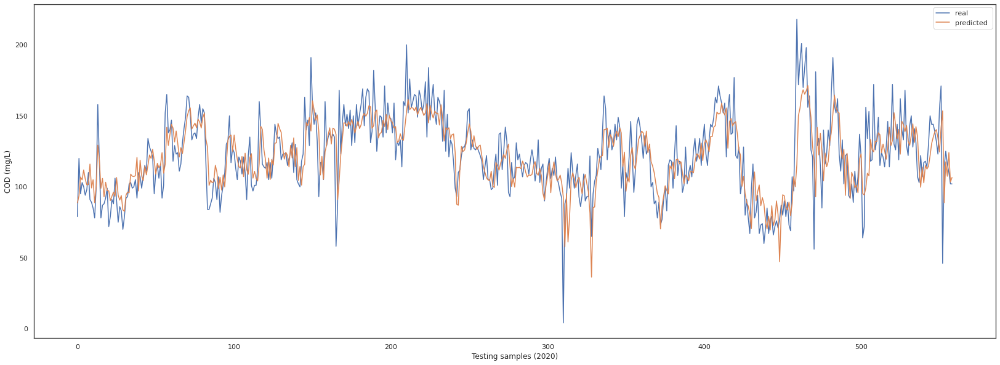

In [155]:
ensemble_model2.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

### Ensemble 3 - Model Selection

In [156]:
class Ensemble3:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
  

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
 
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 16, max_epochs = 50):
    self.model = tf.keras.Sequential()
    self.model.add(Dense(neurons/2, activation='relu', input_dim = self.X_train.shape[1]))
    self.model.add(Dense(neurons, activation='relu'))
    self.model.add(Dense(3, activation='softmax'))

    print(self.Y_train.shape)
    print(self.X_train.shape)

    self.model.compile(optimizer= 'adam', loss='categorical_crossentropy', metrics=['accuracy'])
    history_Ann = self.model.fit(self.X_train, self.Y_train, epochs=max_epochs, verbose=1, validation_split=0.1)
    # Plot training & validation loss values
    plt.plot(history_Ann.history['loss'])
    plt.plot(history_Ann.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

    self.model.save('Ensemble.h5')

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)
    self.df_test[self.goal] = self.df_test[self.goal].fillna(method='ffill')

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal,'model1', 'model2', 'model3']]

    model1 = abs(self.df_test['model1'] - self.df_test['target'])
    model2 = abs(self.df_test['model2'] - self.df_test['target'])
    model3 = abs(self.df_test['model3'] - self.df_test['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Yt = pd.get_dummies(temp)   

    self.Y_test = self.Yt
    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.score = self.model.evaluate(self.X_test, self.Y_test)
    self.prediction = self.model.predict(self.X_test)
    
    self.full_prediction = np.zeros(len(self.prediction))
    self.selection = pd.DataFrame(self.prediction).idxmax(axis=1)

    
    for i in range(len(self.prediction)):
      self.full_prediction[i] = self.df_test[f'model{int(self.selection[i])+1}'][i]
    # print(self.full_prediction)

    self.Ys_test = self.df_test['target']
    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('MAPEsci: ',mean_absolute_error(self.Ys_test, self.full_prediction)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Ys_test, self.full_prediction))
    print ('R2: ',r2_score(self.Ys_test, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Ys_test, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Ys_test, label = 'real ')
    plt.plot(self.full_prediction, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

     0  1  2
0    0  0  1
1    0  1  0
2    0  1  0
3    0  0  1
4    1  0  0
..  .. .. ..
554  0  1  0
555  0  1  0
556  0  0  1
557  0  1  0
558  0  0  1

[559 rows x 3 columns]
(559, 3)
(559, 4)
Epoch 1/50
16/16 [==============================] - 1s 14ms/step - loss: 1.1288 - accuracy: 0.3519 - val_loss: 1.1094 - val_accuracy: 0.3214
Epoch 2/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1158 - accuracy: 0.3519 - val_loss: 1.1088 - val_accuracy: 0.2857
Epoch 3/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1115 - accuracy: 0.3658 - val_loss: 1.1082 - val_accuracy: 0.2679
Epoch 4/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1083 - accuracy: 0.3757 - val_loss: 1.1090 - val_accuracy: 0.2857
Epoch 5/50
16/16 [==============================] - 0s 2ms/step - loss: 1.1059 - accuracy: 0.3738 - val_loss: 1.1094 - val_accuracy: 0.2857
Epoch 6/50
16/16 [==============================] - 0s 3ms/step - loss: 1.1036 - accuracy: 0.3777 - v

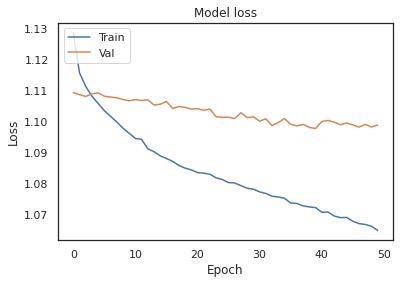

In [157]:
ensemble_model3 = Ensemble3(dataset.iloc[:-cut_off], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
ensemble_model3.training()

18/18 [==============================] - 0s 1ms/step - loss: 1.0672 - accuracy: 0.3900
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(152236735.46122047, shape=(), dtype=float64)
MAPEsci:  1308.0232184344768
MAPE * Founded
MAPE:  15.411051566529924
R2:  0.5815156455149775
RMSE:  17.940302726590375


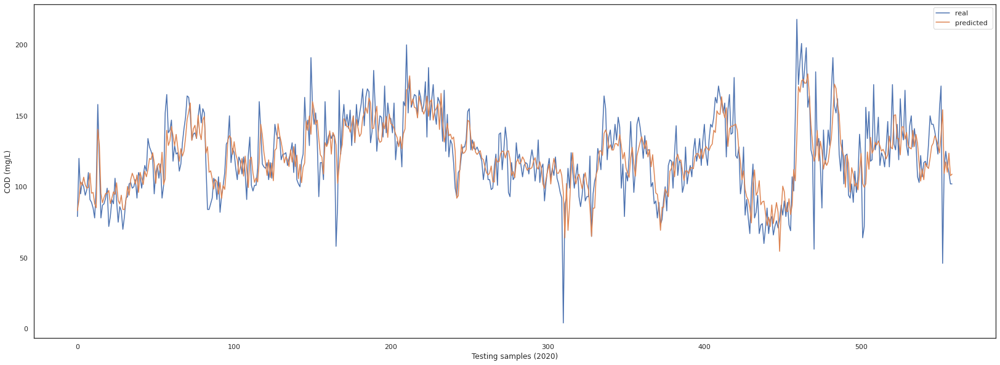

In [158]:
ensemble_model3.testing(dataset.iloc[:-cut_off], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [159]:
ensemble_model3.selection.to_list().count(1)

471

### Ensemble 4

In [160]:
class Ensemble4:
  def __init__(self, df, goal, model1, model2, model3):
    self.df = df.iloc[-len(model1):]
    self.goal = goal
    self.df = self.df.reset_index(drop=True)

    self.df['model1'] = model1
    self.df['model2'] = model2
    self.df['model3'] = model3
 
    self.df['target'] = self.df[self.goal].shift(-1).fillna(method='ffill')
    self.X = self.df[['model1', 'model2', 'model3']]

    model1 = abs(self.df['model1'] - self.df['target'])
    model2 = abs(self.df['model2'] - self.df['target'])
    model3 = abs(self.df['model3'] - self.df['target'])

    temp = pd.concat([model1, model2, model3], axis=1)
    temp = temp.idxmin(axis=1)  
    self.Y = pd.get_dummies(temp)

    # self.Y = self.df['target']
    # print(self.X)

    self.x_mean = self.X.mean()
    self.x_std = self.X.std()
    # self.y_mean = self.Y.mean()
    # self.y_std = self.Y.std()
    # print(self.x_mean, self.y_mean)

    self.X_train = (self.X - self.x_mean)/self.x_std
    self.Y_train = self.Y
    # self.Y_train = (self.Y - self.y_mean)/self.y_std
    # print(self.X_test, self.Y_train)
    print(self.Y_train)

  def pearson_corr(self):
    pearson = self.df.corr(method='pearson')
    fig = plt.figure(figsize=(30,10))
    fig.suptitle('Pearson Correlation', fontsize=16)
    sns.heatmap(pearson,vmax=1, cmap="bwr", linewidths=0.1, annot=True)
    plt.show()

  def training(self, neurons = 8, max_epochs = 50):
    from sklearn.svm import SVR
    self.model = SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.2)
    self.model = self.model.fit(self.X_train.values, self.Y_train.values)
  

  def testing(self, df_test, model1, model2, model3):
    self.df_test = df_test.iloc[-len(model1):]
    self.df_test = self.df_test.reset_index(drop=True)

    self.df_test['model1'] = model1
    self.df_test['model2'] = model2
    self.df_test['model3'] = model3

    self.df_test['target'] = self.df_test[self.goal].shift(-1).fillna(method='ffill')

    self.Xt = self.df_test[[self.goal, 'model1', 'model2', 'model3']]
    self.Y_test = self.df_test['target']
    # print(self.Xt)

    self.X_test = (self.Xt - self.x_mean)/self.x_std
    # print(self.X_test, self.Y_train)

    self.prediction = pd.DataFrame(self.model.predict(self.X_test), columns=['Prediction'])

    self.full_prediction = self.prediction*self.y_std + self.y_mean


    print('*** ANN Ensemble estimation ***')
    print ('MAPEtf: ',tf.keras.losses.mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('MAPEsci: ',mean_absolute_error(self.Y_test.values, self.full_prediction.values)*100)
    print ('MAPE: ',mean_absolute_percentage_error(self.Y_test.values, self.full_prediction.values))
    print ('R2: ',r2_score(self.Y_test.values, self.full_prediction))
    print ('RMSE: ',mean_squared_error(self.Y_test.values, self.full_prediction, squared=False))

    # plot baseline and predictions
    plt.figure(figsize=(28,10))
    plt.plot(self.Y_test.values, label = 'real ')
    plt.plot(self.full_prediction.values, label = 'predicted ')
    plt.ylabel('COD (mg/L)')
    plt.xlabel('Testing samples (2020)')
    plt.legend()
    plt.show()

In [161]:
# ensemble_model4 = Ensemble4(dataset.iloc[:-135], active_target, app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)
# ensemble_model4.training()

## Testing


*** ANN estimation ***
MAPE:  16.70933298348192
R2:  0.2748238368319116
RMSE:  17.246172219026352


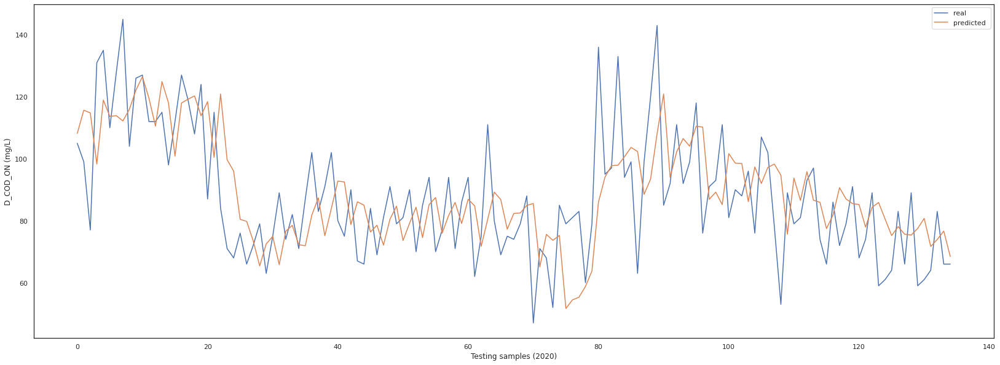

(135,)

In [162]:
app1.testing(dataset.iloc[-(cut_off + 7):])
app1.full_prediction.shape

*** LSTM estimation ***
MAPE:  29.662960985027464
R2:  -0.5529209211923864
RMSE:  25.23745914733085


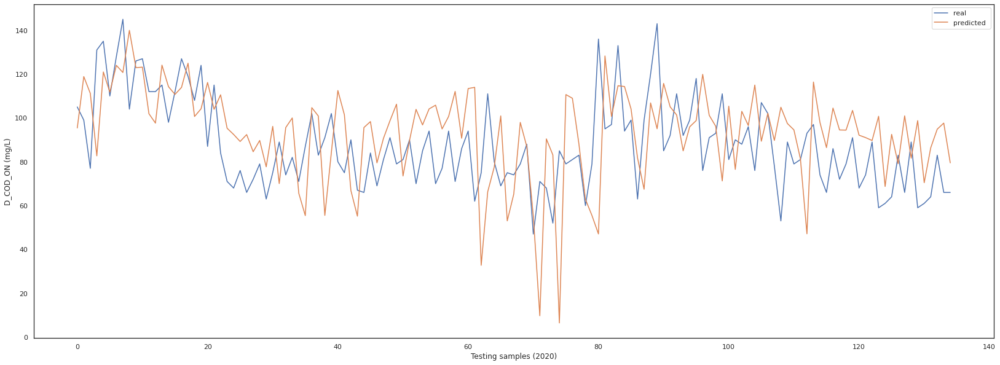

(135, 1)

In [163]:
app2.testing(dataset.iloc[-(cut_off + 2):])
app2.full_prediction.shape

*** Delta estimation ***
MAPE:  22.210052012437448
R2:  -0.11115578196515585
RMSE:  21.348060934250206


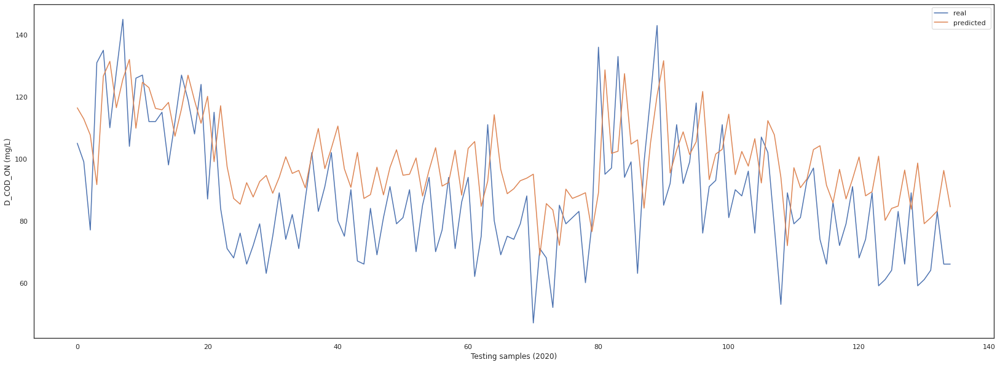

(135,)

In [164]:
app3.testing(dataset.iloc[-cut_off:])
app3.full_prediction.shape

*** Ensemble estimation ***
MAPE:  19.13132036415187


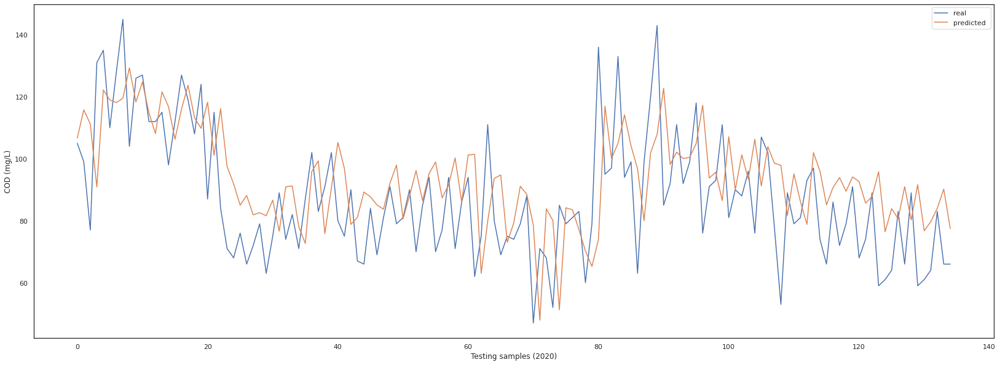

In [165]:
ensemble = (app1.full_prediction + app2.full_prediction['Prediction'] + app3.full_prediction)/3
print('*** Ensemble estimation ***')
print ('MAPE: ',mean_absolute_percentage_error(app2.Y_test.values, ensemble.values))
#print ('R2: ',r2_score(app2.Y_test.values, ensemble.values))
# plot baseline and predictions
plt.figure(figsize=(28,10))
plt.plot(app2.Y_test.values, label = 'real ')
plt.plot(ensemble.values, label = 'predicted ')
plt.ylabel('COD (mg/L)')
plt.xlabel('Testing samples (2020)')
plt.legend()
plt.show()

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[19.283043 43.100807 33.87509  18.166313 46.440964 31.40732  51.610565
 44.635677 73.74278  53.00663  49.19611  26.735613 20.811914 50.58967
 33.921288 33.472168 33.52393  53.609425 26.20348  26.476807 37.173237
 27.334536 32.843807 22.008377 23.300209 18.831964 18.555664 17.43535
 17.594927 21.381178 22.639526 29.51302  18.854048 24.806557 32.360725
 39.144985 28.768284 20.273453 41.677956 18.578783 35.622807 24.970331
 25.204754 39.048473 22.253323 25.474304 19.89385  18.273499 22.360706
 30.104156 23.849474 17.555342 27.7491   23.807005 29.691353 28.85694
 20.561995 26.651472 39.671154 18.602243 41.60706  41.719563 59.307774
 26.087423 24.244843 24.857418 37.804432 24.950327 22.792833 17.574259
 35.91247  76.38733  18.668455 17.413708 77.08059  47.956764 46.070797
 17.703157 36.65899  33.674385 40.05632  60.213573 23.07771  43.150383
 32.83371  25.875885 17.507883 19.443026 29.093298 18.772182 38.656162
 30.73867  24.373644 17.6073

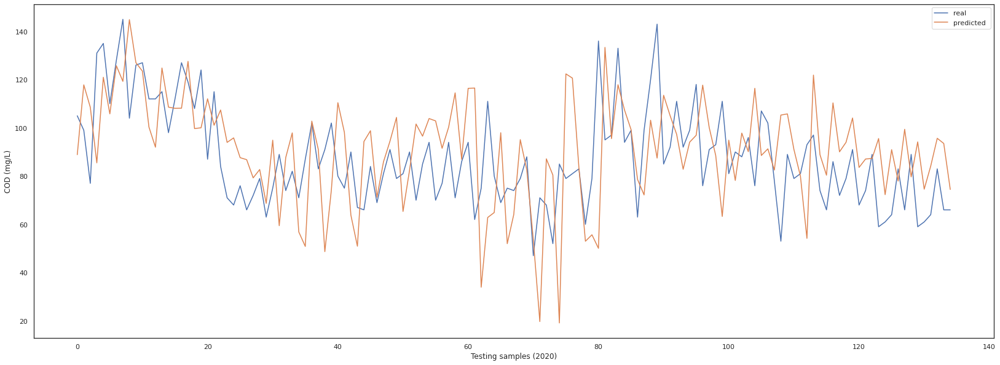

In [166]:
ensemble_model.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(
[ 20.12952   41.924217  34.108154  17.431011  48.02781   31.378784
  46.98132   44.775494  68.97756   45.244087  53.194324  24.906328
  20.922335  48.736496  36.90072   33.41409   36.548267  51.922768
  23.930752  28.23899   42.32881   27.607367  33.17378   21.652922
  19.739965  17.813112  18.538813  17.876627  17.435524  18.257782
  17.511316  24.440166  20.525826  19.09342   26.796919  41.311745
  24.1098    25.875929  42.688053  17.442928  33.555542  22.7599
  24.453041  47.993996  18.726044  18.321804  17.596857  17.520697
  20.42604   26.55396   20.06412   18.414143  26.070705  18.832684
  25.72172   28.01708   17.927698  21.642849  31.979454  17.994724
  27.921164  31.276316  75.78961   27.14076   20.27517   21.883635
  45.197872  26.735455  19.47208   18.036003  40.971554 101.39739
  18.246023  17.419481 109.95731   27.27226   25.367142  18.118076
  22.628897  31.61678   51.929695  41.02277   28.298546  37.87176
  35.997295  2

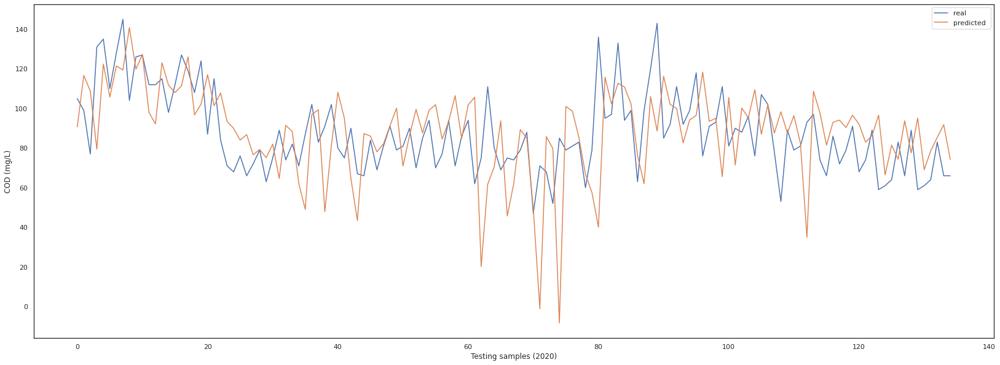

In [167]:
ensemble_model2.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

5/5 [==============================] - 0s 4ms/step - loss: 1.1500 - accuracy: 0.2963
*** ANN Ensemble estimation ***
MAPEtf:  tf.Tensor(22.429904385751698, shape=(), dtype=float64)
MAPEsci:  1833.3993615147795
MAPE:  22.42990438575169
R2:  -0.3928391604754773
RMSE:  23.901295588945473


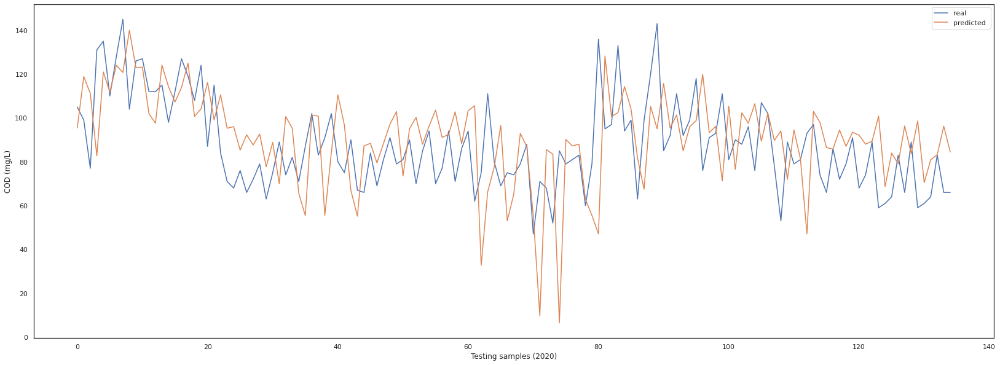

In [168]:
ensemble_model3.testing(dataset.iloc[-cut_off:], app1.full_prediction, app2.full_prediction['Prediction'], app3.full_prediction)

In [169]:
ensemble_model3.selection.to_list().count(3)

0